## 1. 데이터 불러오기
### 필수 라이브러리


In [4]:
import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from pycaret.classification import *

from scipy.stats import chi2_contingency
from statsmodels.tools.tools import add_constant
from sklearn.preprocessing import LabelEncoder

# Suppress warnings
warnings.filterwarnings('ignore')

In [6]:
RANDOM_STATE = 110

## Load data
# LG 원본 데이터셋
train_df = pd.read_csv("data/train.csv")
test_df = pd.read_csv("data/test.csv")

In [7]:
test_df = test_df.drop(['Set ID', 'target'], axis=1)

### 2-1. 결측치 1차 처리

- 밀린 데이터를 한 칸씩 옮겨서 원상복구
- 완성된 df를 저장하기
- 해당 코드는 최초 1번만 수행하고 저장된 df를 불러와서 재사용하면 됨

#### 'OK'값을 결측값으로 처리

In [8]:
# X좌표의 "OK"를 NaN으로 변환

columns_to_replace_ok = [
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'
]

# Train 데이터셋에서 "OK" 값을 NaN으로 변경
for column in columns_to_replace_ok:
    train_df[column] = train_df[column].replace('OK', np.nan).astype(float)

# Test 데이터셋에서 "OK" 값을 NaN으로 변경
for column in columns_to_replace_ok:
    test_df[column] = test_df[column].replace('OK', np.nan).astype(float)

In [9]:
def shift_and_fill(data, start_col, end_col, step):

    start_idx = data.columns.get_loc(start_col)

    end_idx = data.columns.get_loc(end_col)

    missing_indices = data[data[start_col].isnull()].index

    # 결측치가 있는 각 행에 대하여 처리
    for idx in missing_indices:
        current_idx = start_idx

        while current_idx <= end_idx - step:
            next_idx = current_idx + step
            data.iloc[idx, current_idx] = data.iloc[idx, next_idx]
            current_idx = next_idx

        data.iloc[idx, end_idx] = np.nan

In [10]:
#Dam
shift_and_fill(train_df, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
               'WorkMode Collect Result_Dam', 3)
shift_and_fill(test_df, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
               'WorkMode Collect Result_Dam', 3)
#Fill1
shift_and_fill(train_df, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1",
               'WorkMode Collect Result_Fill1', 3)
shift_and_fill(test_df, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1",
               'WorkMode Collect Result_Fill1', 3)

#Fill2
shift_and_fill(train_df, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2",
               'WorkMode Collect Result_Fill2', 3)
shift_and_fill(test_df, "HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2",
               'WorkMode Collect Result_Fill2', 3)


In [11]:
# 마지막 열 채워주기

# train_data
train_df['WorkMode Collect Result_Fill1'] = 7
train_df['WorkMode Collect Result_Dam'] = 7
train_df['WorkMode Collect Result_Fill2'] = 0

# test_data
test_df['WorkMode Collect Result_Fill1'] = 7
test_df['WorkMode Collect Result_Dam'] = 7
test_df['WorkMode Collect Result_Fill2'] = 0


In [12]:
def process_ok_columns(df, col):
    # 'OK' 값을 1로 변경(인코딩)
    df[col].replace('OK', 1, inplace=True)

    # 결측값을 0으로 채우기
    df[col].fillna(0, inplace=True)

    # 'NG' 값을 0으로 변경(인코딩)
    df[col].replace('NG', 0, inplace=True)

cols = ['Chamber Temp. Judge Value_AutoClave', 'GMES_ORIGIN_INSP_JUDGE_CODE Collect Result_AutoClave']
process_ok_columns(train_df, cols[0])
process_ok_columns(test_df,  cols[0])
process_ok_columns(train_df, cols[1])
process_ok_columns(test_df,  cols[1])

In [13]:
##############################################
### 1. Equipment 인코딩
# Equipment_Dam 컬럼에서 #1을 포함하는 값은 0으로, #2를 포함하는 값은 1로 변환
def convert_equipment_values(row):
    if '#1' in str(row):
        return 0
    elif '#2' in str(row):
        return 1
    return row  # #1 또는 #2를 포함하지 않는 경우 원래 값 유지

train_df['Equipment_Dam'] = train_df['Equipment_Dam'].apply(convert_equipment_values)
train_df['Equipment_Fill1'] = train_df['Equipment_Fill1'].apply(convert_equipment_values)
train_df['Equipment_Fill2'] = train_df['Equipment_Fill2'].apply(convert_equipment_values)

test_df['Equipment_Dam'] = test_df['Equipment_Dam'].apply(convert_equipment_values)
test_df['Equipment_Fill1'] = test_df['Equipment_Fill1'].apply(convert_equipment_values)
test_df['Equipment_Fill2'] = test_df['Equipment_Fill2'].apply(convert_equipment_values)

# 컬럼 그룹 정의
equipment_cols = ['Equipment_Dam', 'Equipment_Fill1', 'Equipment_Fill2']
model_suffix_cols = [col for col in train_df.columns if "Model.Suffix" in col]
workorder_cols = [col for col in train_df.columns if "Workorder" in col]
receip_no_cols = [col for col in train_df.columns if "Receip No Collect Result" in col]
pallet_id_cols = [col for col in train_df.columns if "PalletID" in col]
production_qty_cols = [col for col in train_df.columns if "Production" in col]

# 컬럼 그룹을 딕셔너리로 관리
columns_groups = {
    'Model Suffix': model_suffix_cols,
    'Workorder': workorder_cols,
    'Receip No': receip_no_cols,
    'Pallet ID': pallet_id_cols,
    'Production Qty': production_qty_cols,
    'Equipment': equipment_cols  # 추가된 그룹
}


##############################################
### 2. 불일치 ROWS 제거
# 주어진 컬럼 그룹에서 서로 다른 값을 찾는 함수
def find_differences(data, columns):
    if not columns:
        return None  # 주어진 컬럼 그룹이 비어있는 경우 None 반환
    comparison_df = data[columns]
    diff_rows = comparison_df[comparison_df.nunique(axis=1) > 1]  # 행별로 유일한 값의 수를 계산, 1보다 크면 다름
    #print(f'✅ 불일치한 경우의 df shape: (len(rows), len(cols)) = {diff_rows.shape}}')
    print(f'✅ <불일치한 경우> 총 {len(diff_rows)}개 rows가 불일치함. 비교한 {len(diff_rows.columns)}개 columns 정보: {diff_rows.columns.to_list()}')
    return

# 행 제거 함수
def remove_inconsistent_rows(data, columns_groups):
    for key, cols in columns_groups.items():
        diff_rows = find_differences(data, cols)
        if diff_rows is not None:
            data.drop(diff_rows.index, inplace=True)
    return data

train_df = remove_inconsistent_rows(train_df, columns_groups)


##############################################
### 3. 중복 COLUMNS 제거
# => 마지막에 feature group 어차피 선택할거라 걍 skip
'''
remove_cols = ['Model.Suffix_AutoClave', 'Model.Suffix_Fill1', 'Model.Suffix_Fill2',
               'Equipment_Fill1', 'Equipment_Fill2',
               'Workorder_AutoClave', 'Workorder_Fill1', 'Workorder_Fill2',
               'Receip No Collect Result_Fill1', 'Receip No Collect Result_Fill2',
               'Production Qty Collect Result_Fill1', 'Production Qty Collect Result_Fill2',
               'PalletID Collect Result_Fill1','PalletID Collect Result_Fill2']

# 결과 출력
print("삭제 전:")
print(train_df.shape)
print(test_df.shape)

# 삭제
train_df = train_df.drop(columns=remove_cols)
test_df  = test_df.drop(columns=remove_cols)

# 결과 출력
print("삭제 후:")
print(train_df.shape)
print(test_df.shape)
'''

✅ <불일치한 경우> 총 0개 rows가 불일치함. 비교한 4개 columns 정보: ['Model.Suffix_Dam', 'Model.Suffix_AutoClave', 'Model.Suffix_Fill1', 'Model.Suffix_Fill2']
✅ <불일치한 경우> 총 0개 rows가 불일치함. 비교한 4개 columns 정보: ['Workorder_Dam', 'Workorder_AutoClave', 'Workorder_Fill1', 'Workorder_Fill2']
✅ <불일치한 경우> 총 4개 rows가 불일치함. 비교한 3개 columns 정보: ['Receip No Collect Result_Dam', 'Receip No Collect Result_Fill1', 'Receip No Collect Result_Fill2']
✅ <불일치한 경우> 총 83개 rows가 불일치함. 비교한 9개 columns 정보: ['PalletID Collect Result_Dam', 'PalletID Unit Time_Dam', 'PalletID Judge Value_Dam', 'PalletID Collect Result_Fill1', 'PalletID Unit Time_Fill1', 'PalletID Judge Value_Fill1', 'PalletID Collect Result_Fill2', 'PalletID Unit Time_Fill2', 'PalletID Judge Value_Fill2']
✅ <불일치한 경우> 총 93개 rows가 불일치함. 비교한 9개 columns 정보: ['Production Qty Collect Result_Dam', 'Production Qty Unit Time_Dam', 'Production Qty Judge Value_Dam', 'Production Qty Collect Result_Fill1', 'Production Qty Unit Time_Fill1', 'Production Qty Judge Value_Fill1', 'Produ

'\nremove_cols = [\'Model.Suffix_AutoClave\', \'Model.Suffix_Fill1\', \'Model.Suffix_Fill2\',\n               \'Equipment_Fill1\', \'Equipment_Fill2\',\n               \'Workorder_AutoClave\', \'Workorder_Fill1\', \'Workorder_Fill2\',\n               \'Receip No Collect Result_Fill1\', \'Receip No Collect Result_Fill2\',\n               \'Production Qty Collect Result_Fill1\', \'Production Qty Collect Result_Fill2\',\n               \'PalletID Collect Result_Fill1\',\'PalletID Collect Result_Fill2\']\n\n# 결과 출력\nprint("삭제 전:")\nprint(train_df.shape)\nprint(test_df.shape)\n\n# 삭제\ntrain_df = train_df.drop(columns=remove_cols)\ntest_df  = test_df.drop(columns=remove_cols)\n\n# 결과 출력\nprint("삭제 후:")\nprint(train_df.shape)\nprint(test_df.shape)\n'

# EDA

In [14]:
# NaN 변수 확인

nan_columns = train_data.columns[train_data.isna().all()]
nan_columns

Index(['CURE END POSITION X Unit Time_Dam',
       'CURE END POSITION X Judge Value_Dam',
       'CURE END POSITION Z Unit Time_Dam',
       'CURE END POSITION Z Judge Value_Dam',
       'CURE END POSITION Θ Unit Time_Dam',
       'CURE END POSITION Θ Judge Value_Dam', 'CURE SPEED Unit Time_Dam',
       'CURE SPEED Judge Value_Dam', 'CURE STANDBY POSITION X Unit Time_Dam',
       'CURE STANDBY POSITION X Judge Value_Dam',
       ...
       'Machine Tact time Unit Time_Fill2',
       'Machine Tact time Judge Value_Fill2', 'PalletID Unit Time_Fill2',
       'PalletID Judge Value_Fill2', 'Production Qty Unit Time_Fill2',
       'Production Qty Judge Value_Fill2', 'Receip No Unit Time_Fill2',
       'Receip No Judge Value_Fill2', 'WorkMode Unit Time_Fill2',
       'WorkMode Judge Value_Fill2'],
      dtype='object', length=278)

In [15]:
train_data = train_data.drop(nan_columns, axis=1)
train_data

,Wip Line_Dam,Process Desc._Dam,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,Insp. Seq No._Dam,Insp Judge Code_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Θ Collect Result_Dam,...,Head Clean Position Z Collect Result_Fill2,Head Purge Position X Collect Result_Fill2,Head Purge Position Y Collect Result_Fill2,Head Purge Position Z Collect Result_Fill2,Machine Tact time Collect Result_Fill2,PalletID Collect Result_Fill2,Production Qty Collect Result_Fill2,Receip No Collect Result_Fill2,WorkMode Collect Result_Fill2,target
0,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,4F1XA938-1,1,OK,240.0,2.5,-90,...,50.0,91.8,270,50,114.612,19.9,7,127,1,Normal
1,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334505,3KPM0016-2,1,OK,240.0,2.5,-90,...,91.8,270.0,50,85,19.600,7.0,185,1,0,Normal
2,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1X9167-1,1,OK,1000.0,12.5,90,...,50.0,91.8,270,50,114.612,19.8,10,73,1,Normal
3,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3K1X0057-1,1,OK,1000.0,12.5,90,...,91.8,270.0,50,85,19.900,12.0,268,1,0,Normal
4,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3HPM0007-1,1,OK,240.0,2.5,-90,...,91.8,270.0,50,85,19.700,8.0,121,1,0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,3J1XF434-2,1,OK,240.0,2.5,-90,...,91.8,270.0,50,85,19.200,1.0,318,1,0,Normal
40502,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,4E1XC796-1,1,OK,1000.0,12.5,90,...,50.0,91.8,270,50,114.612,20.5,14,197,1,Normal
40503,IVI-OB6,Dam Dispenser,Dam dispenser #1,AJX75334501,4C1XD438-1,1,OK,240.0,2.5,-90,...,50.0,91.8,270,50,85.000,19.7,1,27,1,Normal
40504,IVI-OB6,Dam Dispenser,Dam dispenser #2,AJX75334501,3I1XA258-1,1,OK,1000.0,12.5,90,...,91.8,270.0,50,85,20.100,13.0,117,1,0,Normal


In [16]:
# 고유값 1개인 데이터 확인

single_value_columns = train_data.columns[train_data.nunique() == 1]
len(single_value_columns)

40

In [17]:
train_data = train_data.drop(single_value_columns, axis=1)
train_data

,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,CURE END POSITION X Collect Result_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Θ Collect Result_Dam,CURE SPEED Collect Result_Dam,CURE START POSITION X Collect Result_Dam,CURE START POSITION Θ Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,...,Head Clean Position Z Collect Result_Fill2,Head Purge Position X Collect Result_Fill2,Head Purge Position Y Collect Result_Fill2,Head Purge Position Z Collect Result_Fill2,Machine Tact time Collect Result_Fill2,PalletID Collect Result_Fill2,Production Qty Collect Result_Fill2,Receip No Collect Result_Fill2,WorkMode Collect Result_Fill2,target
0,Dam dispenser #1,AJX75334505,4F1XA938-1,240.0,2.5,-90,100,1030,-90,16,...,50.0,91.8,270,50,114.612,19.9,7,127,1,Normal
1,Dam dispenser #1,AJX75334505,3KPM0016-2,240.0,2.5,-90,70,1030,-90,10,...,91.8,270.0,50,85,19.600,7.0,185,1,0,Normal
2,Dam dispenser #2,AJX75334501,4E1X9167-1,1000.0,12.5,90,85,280,90,16,...,50.0,91.8,270,50,114.612,19.8,10,73,1,Normal
3,Dam dispenser #2,AJX75334501,3K1X0057-1,1000.0,12.5,90,70,280,90,10,...,91.8,270.0,50,85,19.900,12.0,268,1,0,Normal
4,Dam dispenser #1,AJX75334501,3HPM0007-1,240.0,2.5,-90,70,1030,-90,10,...,91.8,270.0,50,85,19.700,8.0,121,1,0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,Dam dispenser #1,AJX75334501,3J1XF434-2,240.0,2.5,-90,70,1030,-90,10,...,91.8,270.0,50,85,19.200,1.0,318,1,0,Normal
40502,Dam dispenser #2,AJX75334501,4E1XC796-1,1000.0,12.5,90,100,280,90,16,...,50.0,91.8,270,50,114.612,20.5,14,197,1,Normal
40503,Dam dispenser #1,AJX75334501,4C1XD438-1,240.0,2.5,-90,100,1030,-90,16,...,50.0,91.8,270,50,85.000,19.7,1,27,1,Normal
40504,Dam dispenser #2,AJX75334501,3I1XA258-1,1000.0,12.5,90,70,280,90,10,...,91.8,270.0,50,85,20.100,13.0,117,1,0,Normal


In [18]:
for z, i in enumerate(train_data.columns):
    print(train_data[i].value_counts())
    print(len(train_data[i].value_counts()))
    print('++++'*5, f'num : {z+1}', '\n')

Equipment_Dam
Dam dispenser #1    25030
Dam dispenser #2    15476
Name: count, dtype: int64
2
++++++++++++++++++++ num : 1 

Model.Suffix_Dam
AJX75334501    33820
AJX75334502     3390
AJX75334505     2635
AJX75334507      310
AJX75334503      162
AJX75334506      129
AJX75334508       60
Name: count, dtype: int64
7
++++++++++++++++++++ num : 2 

Workorder_Dam
3L1X8574-2       272
3K1XC268-1       227
3L1X9934-1       217
3L1X8506-1       217
3K1XA586-2       189
                ... 
4BPM0084-1         2
3FPXX064-0003      2
3H1XB714-1         1
4CPM0166-1         1
3HPM0061-1         1
Name: count, Length: 663, dtype: int64
663
++++++++++++++++++++ num : 3 

CURE END POSITION X Collect Result_Dam
240.0     25030
1000.0    15476
Name: count, dtype: int64
2
++++++++++++++++++++ num : 4 

CURE END POSITION Z Collect Result_Dam
2.5     25030
12.5    15476
Name: count, dtype: int64
2
++++++++++++++++++++ num : 5 

CURE END POSITION Θ Collect Result_Dam
-90    25030
 90    15476
Name: count,

## 남은 칼럼 확인


### Dam
1. Equipment_Dam : 공정 장비 [Dam dispenser #1, Dam dispenser #2]

2. Model.Suffix_Dam : 장비 종류 [7 범주]

3. Workorder_Dam : 식별 코드 [len : 663] > 해방 변수를 파생 변수로 만들 수도?

4. CURE END POSITION X Collect Result_Dam : 경화 종료 X 위치 [len : 2, (240, 1000)]

5. CURE END POSITION Z Collect Result_Dam : 경화 종료 Z 위치 [len : 2, (2.5, 12.5)]

6. CURE END POSITION Θ Collect Result_Dam :  // [len :2, (-90, 90)]

7. CURE SPEED Collect Result_Dam : 경화 속도 [len : 5]

8. CURE START POSITION X Collect Result_Dam : 경화 시작 X 위치 [len : 2. (280, 1030)]

9. CURE START POSITION Θ Collect Result_Dam : // [len : 2, (-90, 90)]

10. DISCHARGED SPEED OF RESIN Collect Result_Dam : 수지 방출 속도 [len : 3]

11. DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam : 수지 방출 시간 s1 [연속]
12. //(s2)
13. //(s3)

14. Dispense Volume(Stage1) Collect Result_Dam : 수지 방출량 s1 [연속]
15. //(s2)
16. //(s3)

17. HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam : X 헤드 위치  s1 [연속 ! OK라는 오류항 존재]
18. //(s2)
19. //(s3)

20. HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam : Y 헤드 위치 s1 [연속]
21. //(s2)
22. //(s3)

23. HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam : Z 헤드 위치 s1 [연속]
24. //(s2)
25. //(s3)

26. HEAD Standby Position X Collect Result_Damv : X 헤드 대기 위치 [연속]
27. // : Y 헤드 대기 위치 [len : 2 (257, 66)]
28. // : Z 헤드 대기 위치 [len : 2 (66, 0)]

29. Head Clean Position X Collect Result_Dam : X 헤드 세척 위치 [len :2 (66, 0)]
30. Head Clean Position Y Collect Result_Dam : Y 헤드 세척 위치 [len :2 (127, 66)]
31. Head Clean Position Z Collect Result_Dam : Z 헤드 세척 위치 [len : 4]

32. Head Purge Position X Collect Result_Dam : X 헤드 찌꺼지 배출 위치 [len ; 4]
33. Head Purge Position Y Collect Result_Dam : Y 헤드 찌꺼지 배출 위치 [len ; 2 (257, 66)]
34. Head Purge Position Z Collect Result_Dam : Z 헤드 찌꺼지 배출 위치 [len ; 4]

35. Head Zero Position X Collect Result_Dam : X 헤드 기본 위치 [len : 2 (130.85, 505)]
36. Head Zero Position Y Collect Result_Dam : X 헤드 기본 위치 [len : 3]
37. Head Zero Position Z Collect Result_Dam : X 헤드 기본 위치 [len : 3]

38. Machine Tact time Collect Result_Dam : 사이클 완료 시간 [연속]

39. PalletID Collect Result_Dam : 팔레트 식별 번호 [len : 374]

40. Production Qty Collect Result_Da : 생산 수량 [연속]

41. Receip No Collect Result_Dam : 영수증 번호 [len : 607]

42. Stage1 Circle1 Distance Speed Collect Result_Dam : CID #1 R 수치 [len : 8 (1, 3, 6, 7, 17, 4000, 5000, 9000]
43. Stage1 Circle2 Distance Speed Collect Result_Dam : CID #2 R 수치 [len : 7 (4000~9000)]
44. Stage1 Circle3 Distance Speed Collect Result_Dam : CID #3 R 수치 [len : 7 (4000~9000)]
45. Stage1 Circle4 Distance Speed Collect Result_Dam : CID #4 R 수치 [len : 7 (4000~9000)]
> 43~45의 값들이 같아 보임.. 상관 확인 필요

46. Stage1 Line1 Distance Speed Collect Result_Dam : CID #1 토출 스피드 [len : 8 (4000~9000)]
47. Stage1 Line2 Distance Speed Collect Result_Dam : CID #2 토출 스피드 [len : 8 (4000~9000)]
48. Stage1 Line3 Distance Speed Collect Result_Dam : CID #3 토출 스피드 [len : 8 (4000~9000)]
49. Stage1 Line4 Distance Speed Collect Result_Dam : CID #4 토출 스피드 [len : 8 (4000~9000)]
> 이들도 유사함이 보임

50...65. Stage2~3 반복

66. THICKNESS 1 Collect Result_Dam : 두께 1? [len : 6 (0값도 존재)]
67. THICKNESS 2 Collect Result_Dam : 두께 2? [len : 6 (0값도 존재)]
68. THICKNESS 3 Collect Result_Dam : 두께 3? [len : 7 (0값도 존재)]

69. WorkMode Collect Result_Dam : [len : 8]

### AutoClave

70. Model.Suffix_AutoClave
71. Workorder_AutoClave

72. 1st Pressure Collect Reulst_AutoClave : 1st 탈포 압력 [연속]
73. 1st Pressure 1st Pressure Unit Time_AutoClave : 1st 탈포 시간 [연속] - feature name 오류 -

74. 2st Pressure Collect Reulst_AutoClave : 2st 탈포 압력 [연속]
75. 2st Pressure Unit Time_AutoClave : 2st 탈포 시간 [연속]

76. 3st Pressure Collect Reulst_AutoClave : 3st 탈포 압력 [연속]
77. 3st Pressure Unit Time_AutoClave : 3st 탈포 시간 [연속]

78. Chamber Temp. Collect Result_AutoClave :챔버 온도 [연속]
79. Chamber Temp. Unit Time_AutoClave : 공정 소요 시간 [연속]
80. Chamber Temp. Judge Value_AutoClave : 평탄도? [OK or NG]

### Fill1
81, 82, 83. Equipment, Model.Suffix, Workorder

84. DISCHARGED SPEED OF RESIN Collect Result_Fill : 토출 속도 [len : 4 , 0값 한개]
85. DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1 : 토출 시간 s1 [연속, 0값 한개]
86. DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1 : 토출 시간 s2 [연속, 0값 한개]
87. DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1 : 토출 시간 s3 [연속, 0값 한개]

88. Dispense Volume(Stage1) Collect Result_Fill1 : 토출량 s1 [연속, 0값 한개]
89. Dispense Volume(Stage2) Collect Result_Fill1 : 토출량 s2 [연속, 0값 한개]
90. Dispense Volume(Stage3) Collect Result_Fill1 : 토출량 s3 [연속, 0값 한개]

91. HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1 : OK항 존재
92. HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1 : [연속]
93. HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1 : [연속]

94. HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1 : [연속]
95. HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1 : [연속]
96. HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1 : [연속]

97. HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1 ; [연속]
98. HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1 ; [연속]
99. HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1 ; [연속]

100. HEAD Standby Position X Collect Result_Fill1 : [연속]
101. HEAD Standby Position Y Collect Result_Fill1 : [len 2: (289, 50)]
102. HEAD Standby Position Z Collect Result_Fill1 : [len 2 : (50, 0)]
> Y,Z 비율 같음 : 변수 합칠 수 있을 듯

103. Head Clean Position X Collect Result_Fill1 : [len 2 : (0.0, 123.4)]
104. Head Clean Position Y Collect Result_Fill1 : [len 2 : (123.4, 50.0)]
105. Head Clean Position Z Collect Result_Fill1 : [len 2 : (0.0, 123.4)]
> X, Y, Z 비율 같음

106. Head Purge Position X Collect Result_Fill1 : [len 2 : (92.2, 289,0)]
107. Head Purge Position Y Collect Result_Fill1 : [len 2 : (289, 50)]
108. Head Purge Position Z Collect Result_Fill1 : [len 3 : (50, 85, 145)]

109, 110, 111, 112, 113. Machine Tact Time, PalletID, Production Qty, Recip No, WorkMode 

### Fill2

114, 115, 116. Equipment, Model.Suffix, Workorder

117. CURE END POSITION X Collect Result_Fill2 : [len 2 :(240, 1020)]
118. CURE END POSITION Z Collect Result_Fill2 : [len 3]

119. CURE SPEED Collect Result_Fill2 : [연속]

120. CURE STANDBY POSITION Z Collect Result_Fill2 : [len 4]

121. CURE START POSITION X Collect Result_Fill2 : [len 2 : (1020, 240)]
> 107과 비율 같음

122. CURE START POSITION Z Collect Result_Fill2 : [len 4]

123. HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2 : [len 3] ! OK 항 있음
124. HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2 : [len 5]
> 113의 OK항을 제외하면 비율이 같음... 이걸로 OK항 대체할 수도?

125. HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2 : [len 4]

126. HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill2 : [len : 5]
127. HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2 : [len : 3]
128. HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2 : [len : 3]
> 117, 118 비율 같음

129. HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill2 : [len : 4]
130. HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill2 : [len : 2]
131. HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2 : [len : 2]
> 120, 121 비율, 값 같음

132. HEAD Standby Position X Collect Result_Fill2 : [len : 3]
133. HEAD Standby Position Y Collect Result_Fill2 : [len : 2]
134. HEAD Standby Position Z Collect Result_Fill2 : [len : 2]
> 123, 124 비율 같음

135. Head Clean Position X Collect Result_Fill2 : [len : 2]
136. Head Clean Position Y Collect Result_Fill2 : [len : 2]
137. Head Clean Position Z Collect Result_Fill2 : [len : 2]
> 125, 126, 127 비율 같음

138. Head Purge Position X Collect Result_Fill2 : [len : 2]
139. Head Purge Position Y Collect Result_Fill2 : [len : 2]
140. Head Purge Position Z Collect Result_Fill2 : [len : 2]
> 128, 129, 130 비율 같음

141, 142, 143, 144, 145. Machine Tact Time, PalletID, Production Qty, Recip No, WorkMode 

146. traget : [len 2 : (38156, 2350)]

# Dam 데이터 확인

In [19]:
Dam_data = train_data.filter(like = 'Dam')
print(f'Dam shape : {Dam_data.shape}')
Dam_data.describe()

Dam shape : (40506, 69)


,CURE END POSITION X Collect Result_Dam,CURE END POSITION Z Collect Result_Dam,CURE END POSITION Θ Collect Result_Dam,CURE SPEED Collect Result_Dam,CURE START POSITION X Collect Result_Dam,CURE START POSITION Θ Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam,...,Stage3 Circle3 Distance Speed Collect Result_Dam,Stage3 Circle4 Distance Speed Collect Result_Dam,Stage3 Line1 Distance Speed Collect Result_Dam,Stage3 Line2 Distance Speed Collect Result_Dam,Stage3 Line3 Distance Speed Collect Result_Dam,Stage3 Line4 Distance Speed Collect Result_Dam,THICKNESS 1 Collect Result_Dam,THICKNESS 2 Collect Result_Dam,THICKNESS 3 Collect Result_Dam,WorkMode Collect Result_Dam
count,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,...,40506.00000,40506.00000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000
mean,530.370809,6.320669,-21.227966,73.864119,743.449859,-21.227966,12.882437,14.272249,6.861304,14.262638,...,6446.12650,6446.12650,6440.892707,6443.633042,6440.892707,6442.497408,3465.728534,-0.001699,-0.008232,2.837479
std,369.283055,4.858988,87.461776,9.761997,364.424068,87.461776,2.997650,3.743857,1.994393,3.733232,...,1683.45344,1683.45344,1678.607276,1683.742070,1678.607276,1683.872285,2954.932792,0.009579,0.033599,3.441728
min,240.000000,2.500000,-90.000000,70.000000,280.000000,-90.000000,10.000000,9.600000,3.800000,9.600000,...,4000.00000,4000.00000,4000.000000,4000.000000,4000.000000,4000.000000,0.000000,-0.054000,-0.219000,-0.118000
25%,240.000000,2.500000,-90.000000,70.000000,280.000000,-90.000000,10.000000,13.100000,4.900000,13.100000,...,5000.00000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,0.000000,0.000000,0.000000,0.000000
50%,240.000000,2.500000,-90.000000,70.000000,1030.000000,-90.000000,10.000000,13.200000,6.700000,13.200000,...,6500.00000,6500.00000,6500.000000,6500.000000,6500.000000,6500.000000,4000.000000,0.000000,0.000000,0.000000
75%,1000.000000,12.500000,90.000000,70.000000,1030.000000,90.000000,16.000000,17.000000,8.400000,17.000000,...,6500.00000,6500.00000,6500.000000,6500.000000,6500.000000,6500.000000,6500.000000,0.000000,0.000000,7.000000
max,1000.000000,12.500000,90.000000,105.000000,1030.000000,90.000000,16.000000,21.300000,10.600000,21.400000,...,9000.00000,9000.00000,9000.000000,9000.000000,9000.000000,9000.000000,6500.000000,0.037000,0.007000,7.000000


In [20]:
def plot_dist(X, Y, data):
    i = 0
    plt.figure(figsize=(25, 20))
    plt.subplots(Y, X, figsize=(25, 20))
    
    for c in data.columns:
        i += 1
        plt.subplot(Y, X, i)
        
        if pd.api.types.is_numeric_dtype(data[c]):
            sns.histplot(data[c], kde=True)
        else:
            sns.countplot(y=data[c])
    
    plt.tight_layout()
    plt.show()


<Figure size 2500x2000 with 0 Axes>

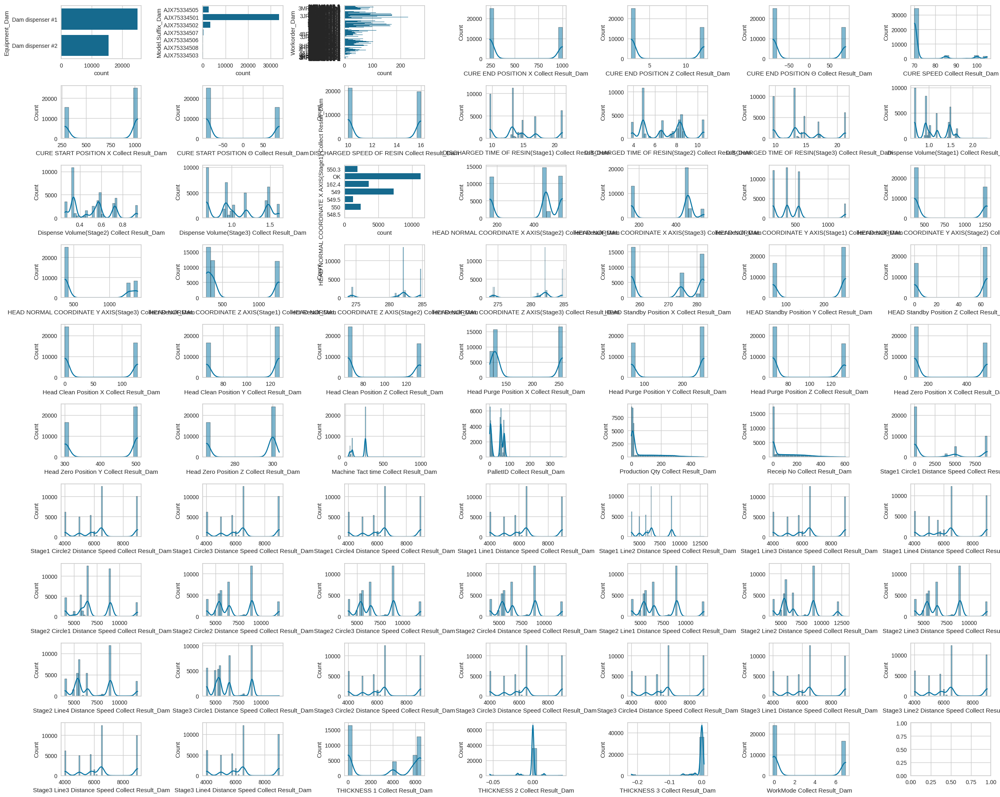

In [21]:
plot_dist(7, 10, Dam_data)

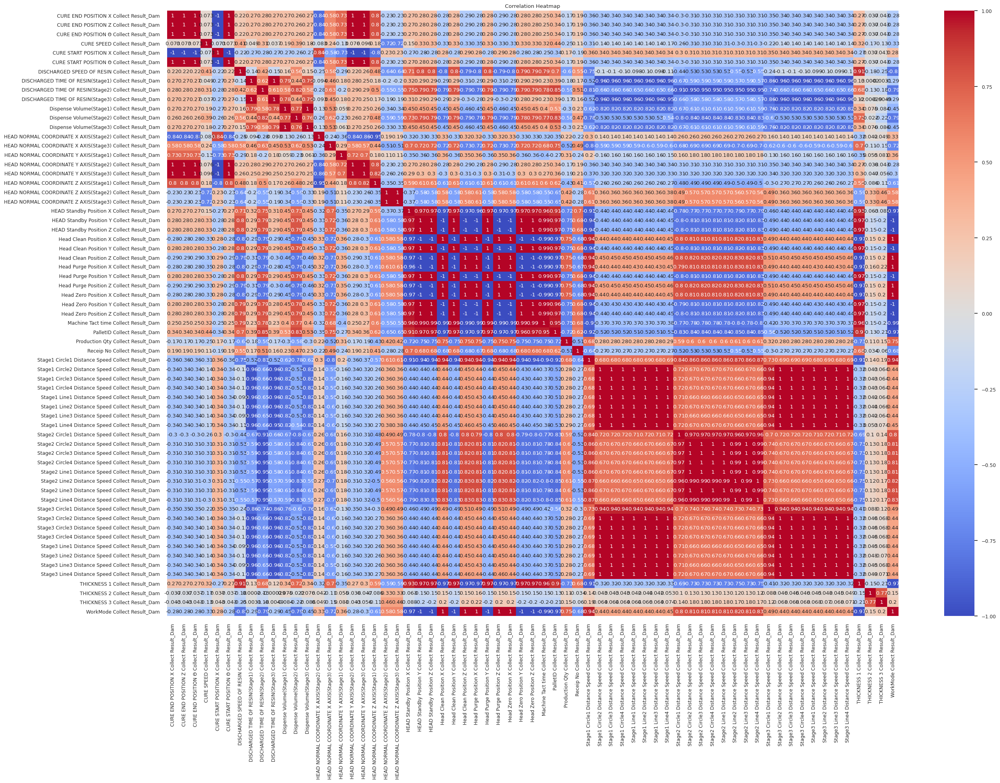

In [23]:
sns.set(font_scale=0.8)
plt.figure(figsize=(30, 20))

# 수치형 컬럼만 선택
numeric_cols = Dam_data.select_dtypes(include='number')

sns.heatmap(numeric_cols.corr(method='pearson'), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [24]:
def find_pair(data):
    num_data = data[data.describe().columns]
    cor_mat = num_data.corr()
    perfect_cor = []

    for i in range(len(cor_mat)):
        for j in range(i + 1, len(cor_mat)):
            if np.isclose(cor_mat.iloc[i, j], 1.0):
                perfect_cor.append((cor_mat.index[i], cor_mat.columns[j]))

    for k in perfect_cor:
        print(k)
    return perfect_cor

In [25]:
perfect_cor = find_pair(Dam_data)

('CURE END POSITION X Collect Result_Dam', 'CURE END POSITION Z Collect Result_Dam')
('CURE END POSITION X Collect Result_Dam', 'CURE END POSITION Θ Collect Result_Dam')
('CURE END POSITION X Collect Result_Dam', 'CURE START POSITION Θ Collect Result_Dam')
('CURE END POSITION Z Collect Result_Dam', 'CURE END POSITION Θ Collect Result_Dam')
('CURE END POSITION Z Collect Result_Dam', 'CURE START POSITION Θ Collect Result_Dam')
('CURE END POSITION Θ Collect Result_Dam', 'CURE START POSITION Θ Collect Result_Dam')
('HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam')
('HEAD Standby Position Y Collect Result_Dam', 'HEAD Standby Position Z Collect Result_Dam')
('HEAD Standby Position Y Collect Result_Dam', 'Head Clean Position Y Collect Result_Dam')
('HEAD Standby Position Y Collect Result_Dam', 'Head Purge Position Y Collect Result_Dam')
('HEAD Standby Position Z Collect Result_Dam', 'Head Clean Position Y Collect Result_Dam

In [26]:
def check_pair(list, data):
    per_cor_variables = []
    i = 0
    print('===' * 5, 'check pair')
    for j in list:
        sum_variable = data[j[0]] + data[j[1]]
        if len(np.unique(sum_variable)) == 2:
            print('OK', end = ' ')
            per_cor_variables.append(j)
        else:
            i += 1
            print('NG', end = ' ')
    
    print('\n','===' * 5, f'Whole : {len(list)}',  f'/ num of NG : {i}')
    return per_cor_variables

per_cor_variables = check_pair(perfect_cor, Dam_data)

=============== check pair
OK OK OK OK OK OK NG OK OK OK OK OK OK OK NG NG NG NG NG NG NG NG NG NG NG NG NG NG NG NG NG NG NG 
 =============== Whole : 33 / num of NG : 20


In [27]:
# 완벽한 상관 1 확인.
unique_variables = set()

# 각 쌍에서 변수들을 세트에 추가
for pair in per_cor_variables:
    unique_variables.update(pair)
    unique_variables_list = list(unique_variables)
unique_variables_list

['HEAD Standby Position Y Collect Result_Dam',
 'Head Zero Position X Collect Result_Dam',
 'CURE END POSITION Θ Collect Result_Dam',
 'Head Clean Position Y Collect Result_Dam',
 'Head Purge Position Y Collect Result_Dam',
 'CURE START POSITION Θ Collect Result_Dam',
 'CURE END POSITION X Collect Result_Dam',
 'Head Clean Position X Collect Result_Dam',
 'HEAD Standby Position Z Collect Result_Dam',
 'CURE END POSITION Z Collect Result_Dam']

<Figure size 2500x2000 with 0 Axes>

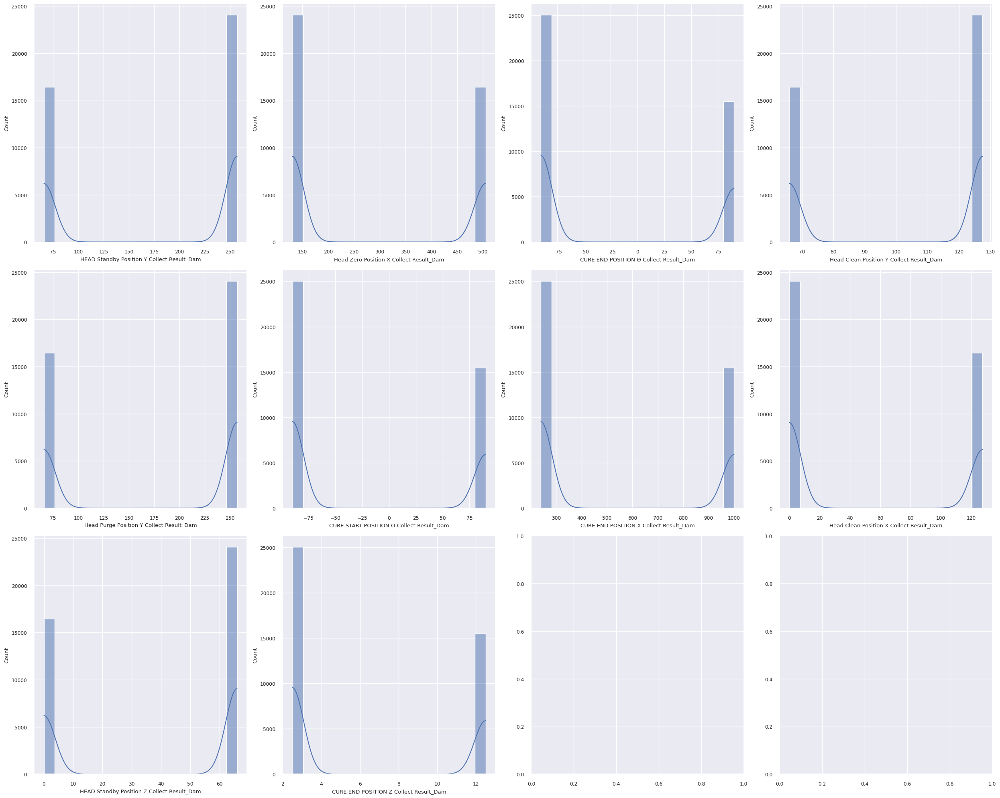

In [28]:
plot_dist(4, 3, Dam_data[unique_variables_list])

In [29]:
per_cor_variables

[('CURE END POSITION X Collect Result_Dam',
  'CURE END POSITION Z Collect Result_Dam'),
 ('CURE END POSITION X Collect Result_Dam',
  'CURE END POSITION Θ Collect Result_Dam'),
 ('CURE END POSITION X Collect Result_Dam',
  'CURE START POSITION Θ Collect Result_Dam'),
 ('CURE END POSITION Z Collect Result_Dam',
  'CURE END POSITION Θ Collect Result_Dam'),
 ('CURE END POSITION Z Collect Result_Dam',
  'CURE START POSITION Θ Collect Result_Dam'),
 ('CURE END POSITION Θ Collect Result_Dam',
  'CURE START POSITION Θ Collect Result_Dam'),
 ('HEAD Standby Position Y Collect Result_Dam',
  'HEAD Standby Position Z Collect Result_Dam'),
 ('HEAD Standby Position Y Collect Result_Dam',
  'Head Clean Position Y Collect Result_Dam'),
 ('HEAD Standby Position Y Collect Result_Dam',
  'Head Purge Position Y Collect Result_Dam'),
 ('HEAD Standby Position Z Collect Result_Dam',
  'Head Clean Position Y Collect Result_Dam'),
 ('HEAD Standby Position Z Collect Result_Dam',
  'Head Purge Position Y Colle

In [30]:
# 파생변수 없이 제거해보기
del_col = ['CURE END POSITION Z Collect Result_Dam',
          'CURE END POSITION Θ Collect Result_Dam',
          'CURE START POSITION Θ Collect Result_Dam',
          'HEAD Standby Position Z Collect Result_Dam',
          'Head Clean Position Y Collect Result_Dam',
          'Head Purge Position Y Collect Result_Dam',
          'Head Zero Position X Collect Result_Dam']

Dam_data = Dam_data.drop(del_col, axis=1)
Dam_data

,Equipment_Dam,Model.Suffix_Dam,Workorder_Dam,CURE END POSITION X Collect Result_Dam,CURE SPEED Collect Result_Dam,CURE START POSITION X Collect Result_Dam,DISCHARGED SPEED OF RESIN Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam,DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam,...,Stage3 Circle3 Distance Speed Collect Result_Dam,Stage3 Circle4 Distance Speed Collect Result_Dam,Stage3 Line1 Distance Speed Collect Result_Dam,Stage3 Line2 Distance Speed Collect Result_Dam,Stage3 Line3 Distance Speed Collect Result_Dam,Stage3 Line4 Distance Speed Collect Result_Dam,THICKNESS 1 Collect Result_Dam,THICKNESS 2 Collect Result_Dam,THICKNESS 3 Collect Result_Dam,WorkMode Collect Result_Dam
0,Dam dispenser #1,AJX75334505,4F1XA938-1,240.0,100,1030,16,14.9,8.4,14.7,...,5800,5800,5800,5800,5800,5800,5800,0.000,0.000,0.000
1,Dam dispenser #1,AJX75334505,3KPM0016-2,240.0,70,1030,10,21.3,4.9,21.3,...,4000,4000,4000,4000,4000,4000,0,0.000,0.000,7.000
2,Dam dispenser #2,AJX75334501,4E1X9167-1,1000.0,85,280,16,14.7,8.5,14.7,...,5800,5800,5800,5800,5800,5800,5800,0.012,-0.022,0.003
3,Dam dispenser #2,AJX75334501,3K1X0057-1,1000.0,70,280,10,21.3,8.4,21.3,...,4000,4000,4000,4000,4000,4000,0,0.000,0.000,7.000
4,Dam dispenser #1,AJX75334501,3HPM0007-1,240.0,70,1030,10,9.7,4.9,9.6,...,9000,9000,9000,9000,9000,9000,0,0.000,0.000,7.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40501,Dam dispenser #1,AJX75334501,3J1XF434-2,240.0,70,1030,10,17.0,5.0,17.0,...,5000,5000,5000,5000,5000,5000,0,0.000,0.000,7.000
40502,Dam dispenser #2,AJX75334501,4E1XC796-1,1000.0,100,280,16,14.9,8.5,14.7,...,5800,5800,5800,5800,5800,5800,5800,-0.019,-0.021,-0.118
40503,Dam dispenser #1,AJX75334501,4C1XD438-1,240.0,100,1030,16,14.2,8.2,14.3,...,6000,6000,6000,6000,6000,6000,6000,0.000,0.000,0.000
40504,Dam dispenser #2,AJX75334501,3I1XA258-1,1000.0,70,280,10,9.7,4.9,9.7,...,9000,9000,9000,9000,9000,9000,0,0.000,0.000,7.000


## target과의 관계 확인

In [31]:
Dam_data['target'] = train_data['target']

def target_plot(data):
    for feature in data.columns:
        if feature == 'target':
            continue  # 타겟 변수 자체는 건너뜀

        plt.figure(figsize=(8, 6))
        
        if pd.api.types.is_numeric_dtype(data[feature]):
            # 수치형 변수에 대한 distplot
            sns.histplot(data[data['target'] == 'Normal'][feature], color='blue', label='Normal', kde=True, alpha=0.5)
            sns.histplot(data[data['target'] == 'AbNormal'][feature], color='red', label='AbNormal', kde=True, alpha=0.5)
            plt.title(f'Distribution of {feature} by Target')
            plt.xlabel(feature)
            plt.ylabel('Frequency')
        
        else:
            # 범주형 변수에 대한 barplot
            # 각 범주에 대한 타겟 빈도를 계산
            category_counts = data.groupby([feature, 'target']).size().reset_index(name='count')
            sns.barplot(x=feature, y='count', hue='target', data=category_counts, alpha=0.7)
            plt.title(f'Bar Plot of {feature} by Target')
            plt.ylabel('Count')

        plt.legend()
        plt.show()

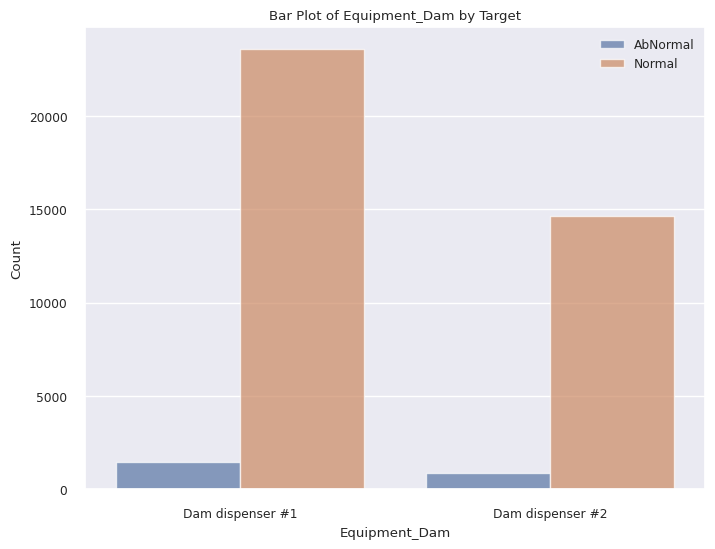

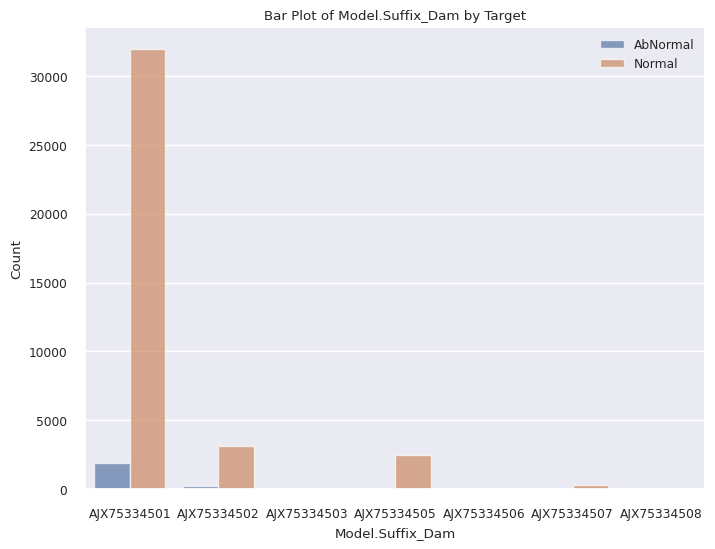

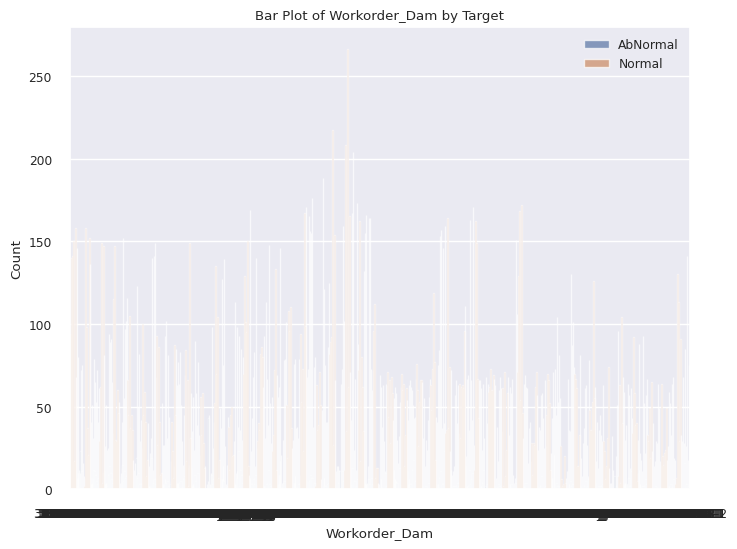

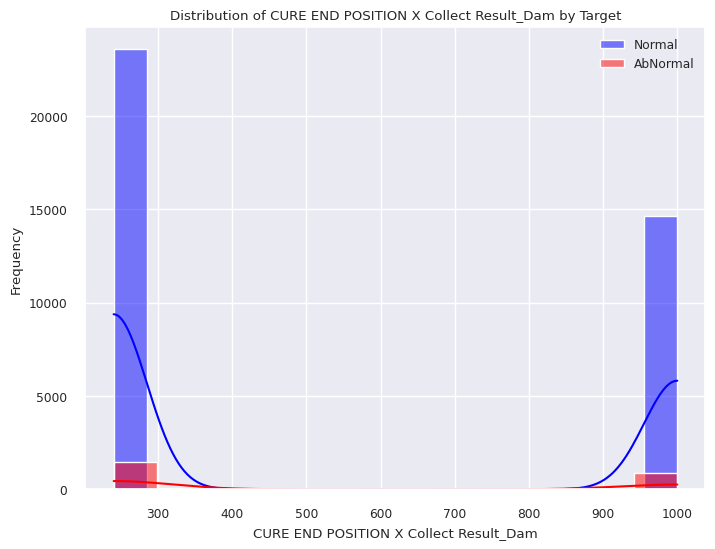

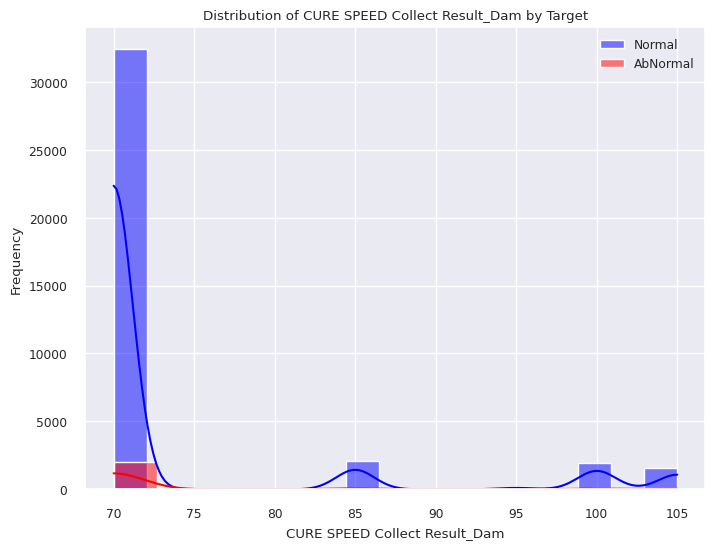

...

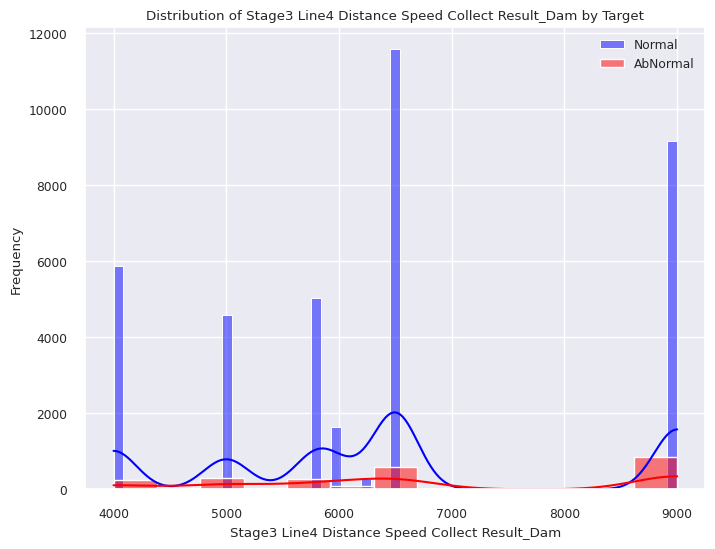

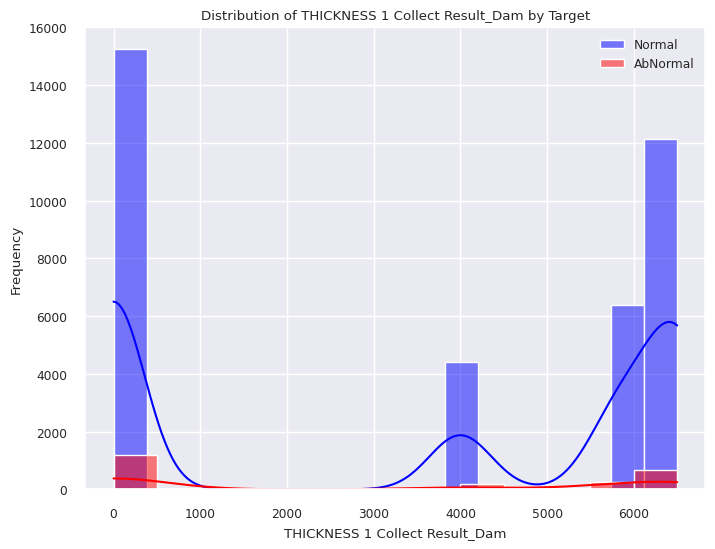

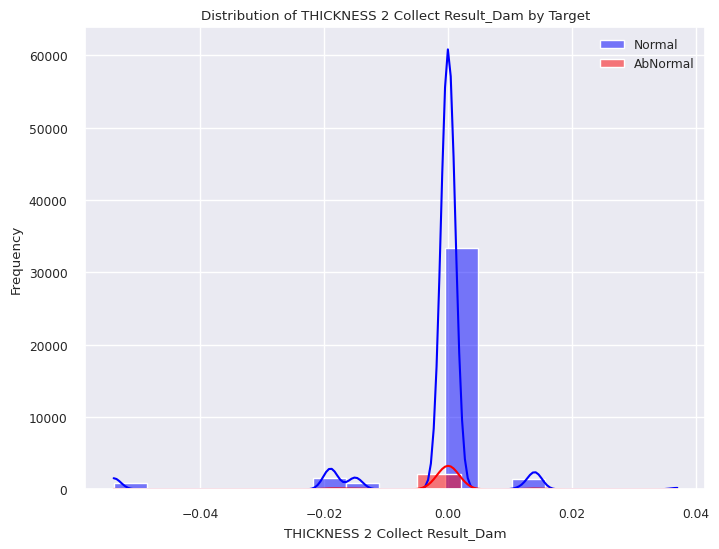

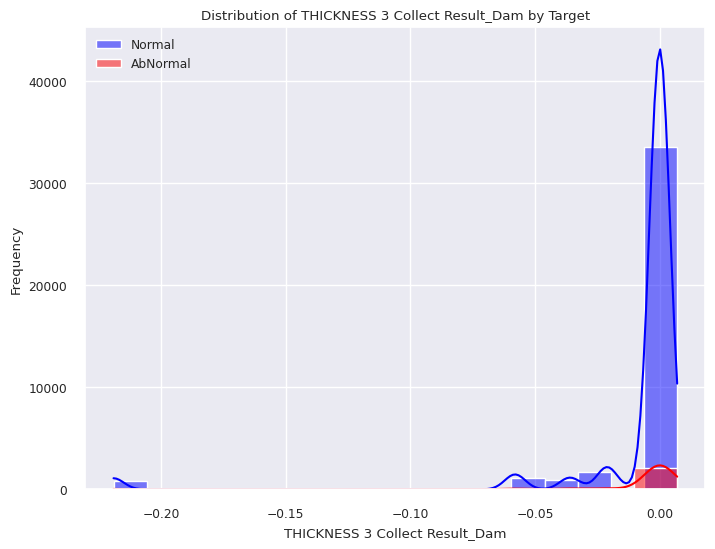

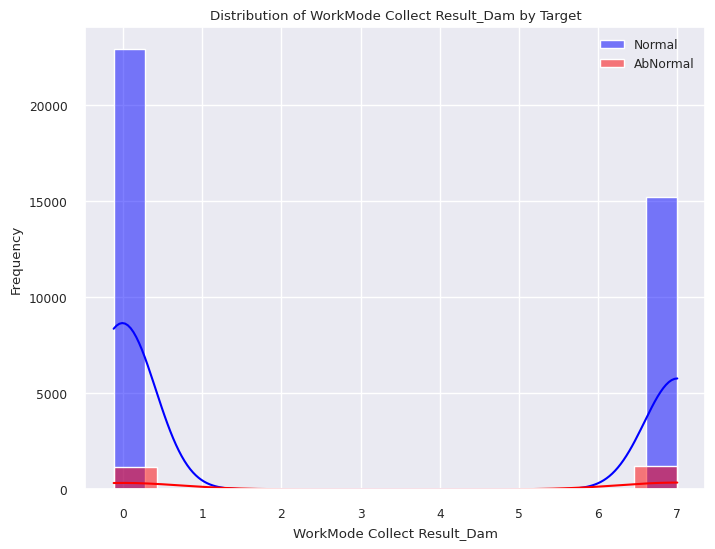

In [32]:
target_plot(Dam_data)

In [33]:
def calculate_proportion(data):
    # 결과를 저장할 딕셔너리
    proportion_dict = {}

    # 각 변수를 타겟별로 그룹화하여 비율 계산
    for feature in data.columns:
        if feature == 'target':
            continue  # 타겟 변수는 건너뜀

        # 그룹화하여 크기 계산
        grouped = data.groupby(['target', feature]).size()

        # 각 타겟별 전체 크기로 나눠 비율 계산
        proportion = grouped / grouped.groupby(level=0).sum()

        # 데이터 프레임으로 변환 후 피벗
        proportion_df = proportion.reset_index(name='Proportion')
        pivot_df = proportion_df.pivot(index=feature, columns='target', values='Proportion').fillna(0)

        # 데이터 프레임을 딕셔너리에 저장
        proportion_dict[feature] = pivot_df

    return proportion_dict

proportion_results = calculate_proportion(Dam_data)

# 결과 출력
for feature, df in proportion_results.items():
    print(f"Feature: {feature}")
    print(df)
    print("\n")

Feature: Equipment_Dam
target            AbNormal    Normal
Equipment_Dam                       
Dam dispenser #1  0.631915  0.617072
Dam dispenser #2  0.368085  0.382928


Feature: Model.Suffix_Dam
target            AbNormal    Normal
Model.Suffix_Dam                    
AJX75334501       0.816170  0.836094
AJX75334502       0.097872  0.082818
AJX75334503       0.018723  0.003093
AJX75334505       0.055319  0.065652
AJX75334506       0.003404  0.003171
AJX75334507       0.007660  0.007653
AJX75334508       0.000851  0.001520


Feature: Workorder_Dam
target         AbNormal    Normal
Workorder_Dam                    
3F1X5847-2     0.005106  0.002464
3F1X9643-1     0.002979  0.003669
3F1X9644-1     0.006809  0.003695
3F1X9648-1     0.004255  0.003931
3F1X9648-2     0.000426  0.000446
...                 ...       ...
4F1XB043-1     0.000426  0.000681
4F1XB596-1     0.001277  0.003695
4F1XB738-1     0.000000  0.000472
4F1XB758-1     0.000851  0.001966
4F1XB758-2     0.004255  0.000917



HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam의 경우 OK 결측치가 있는데, 548.5의 비율이 0.13정도 차이나는 것을 보니 해당 변수를 살리는것도 좋을 것 같음

# AutoClave 데이터 확인

In [34]:
AC_data = train_data.filter(like = 'AutoClave')
print(f'AC shape : {AC_data.shape}')
AC_data.describe()

AC shape : (40506, 11)


,1st Pressure Collect Result_AutoClave,1st Pressure 1st Pressure Unit Time_AutoClave,2nd Pressure Collect Result_AutoClave,2nd Pressure Unit Time_AutoClave,3rd Pressure Collect Result_AutoClave,3rd Pressure Unit Time_AutoClave,Chamber Temp. Collect Result_AutoClave,Chamber Temp. Unit Time_AutoClave
count,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000
mean,0.307124,244.949119,0.396764,56.932035,0.501117,122.104059,51.691725,423.985212
std,0.005369,21.475360,0.096129,56.123765,0.025190,8.775836,2.878083,61.066771
min,0.290000,0.000000,0.297000,0.000000,0.305000,1.000000,32.000000,3.000000
25%,0.302000,241.000000,0.309000,1.000000,0.498000,120.000000,49.000000,363.000000
50%,0.308000,241.000000,0.316000,60.000000,0.499000,121.000000,52.000000,452.000000
75%,0.312000,241.000000,0.491000,121.000000,0.500000,121.000000,54.000000,483.000000
max,0.319000,300.000000,0.900000,181.000000,0.914000,301.000000,59.000000,540.000000


<Figure size 2500x2000 with 0 Axes>

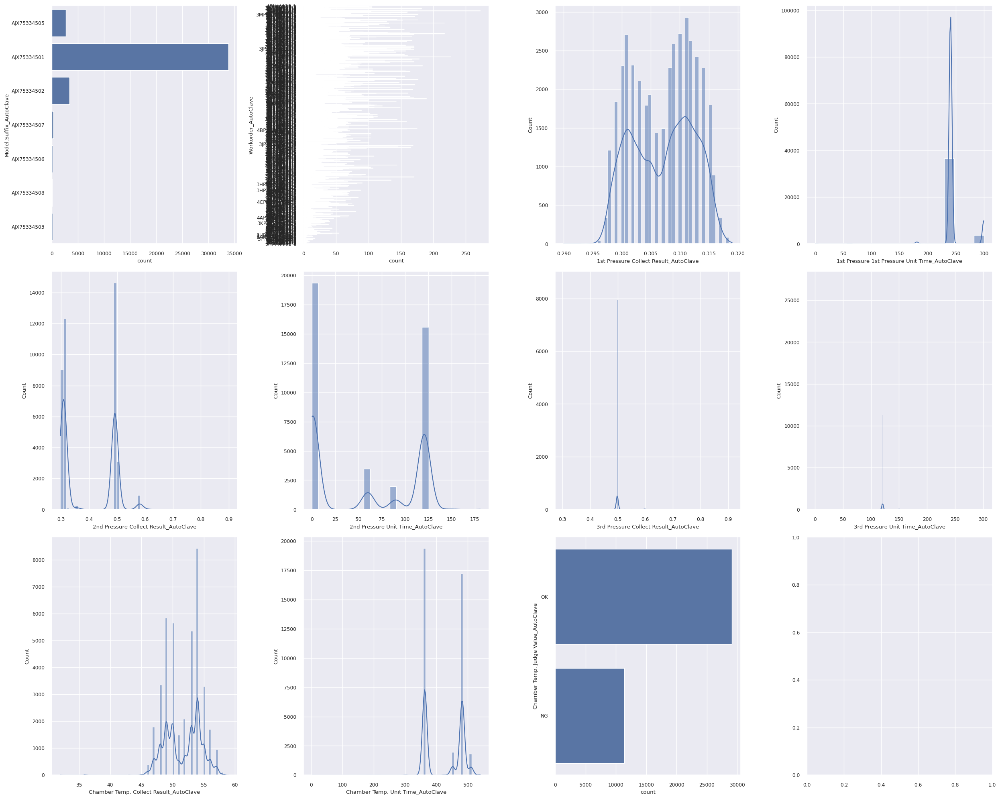

In [35]:
plot_dist(4, 3, AC_data)

Text(0.5, 1.0, 'Correlation Heatmap')

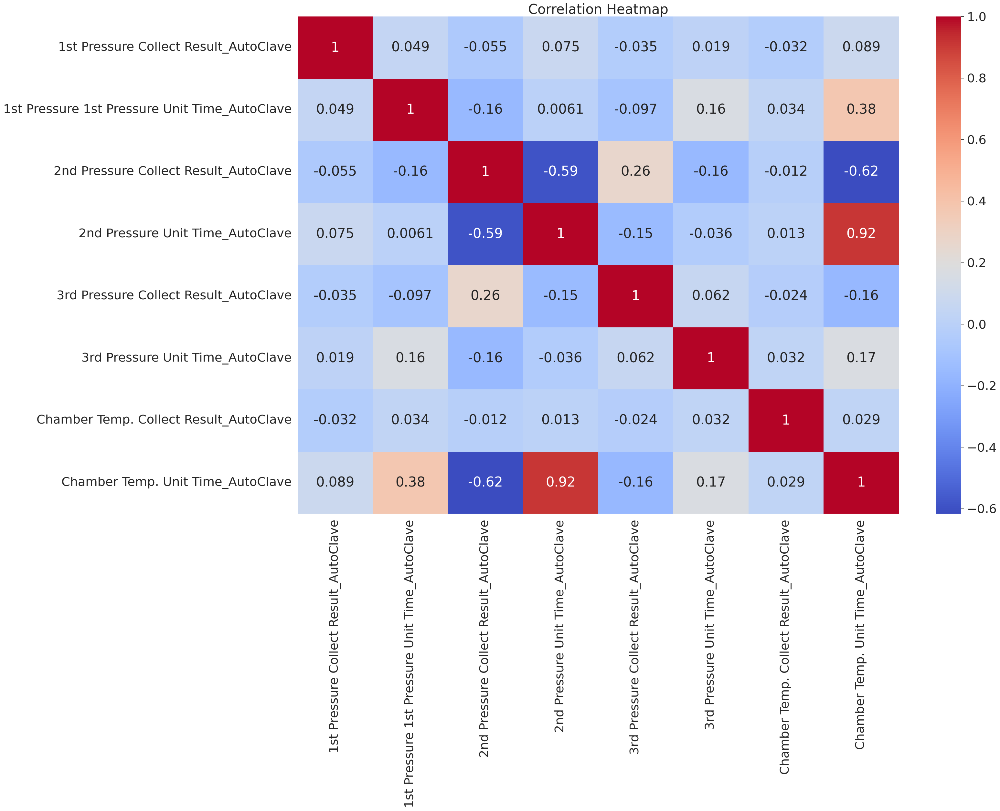

In [40]:
sns.set(font_scale=2.5)
plt.figure(figsize=(30, 20))

numeric_cols = AC_data.select_dtypes(include='number')

sns.heatmap(numeric_cols.corr(method='pearson'), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')

## target과 관계 확인

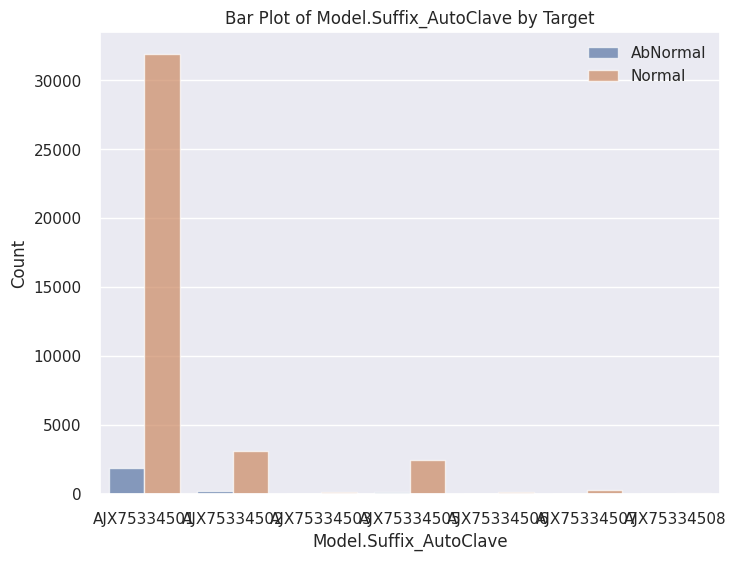

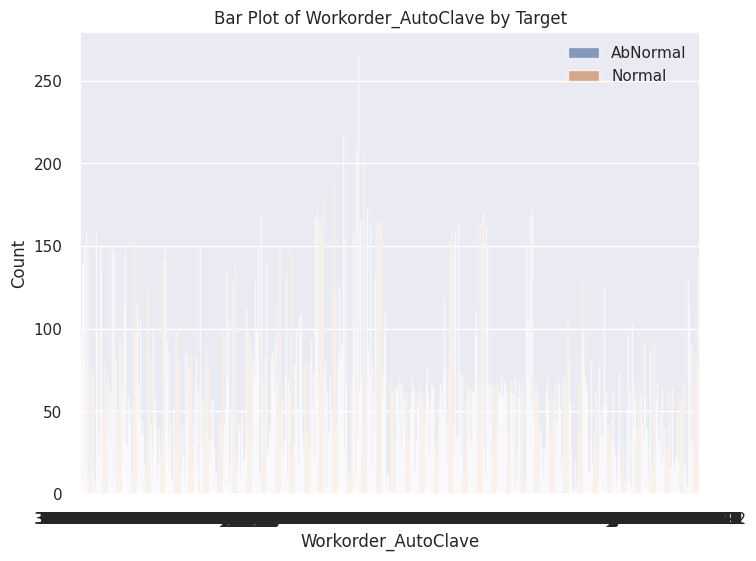

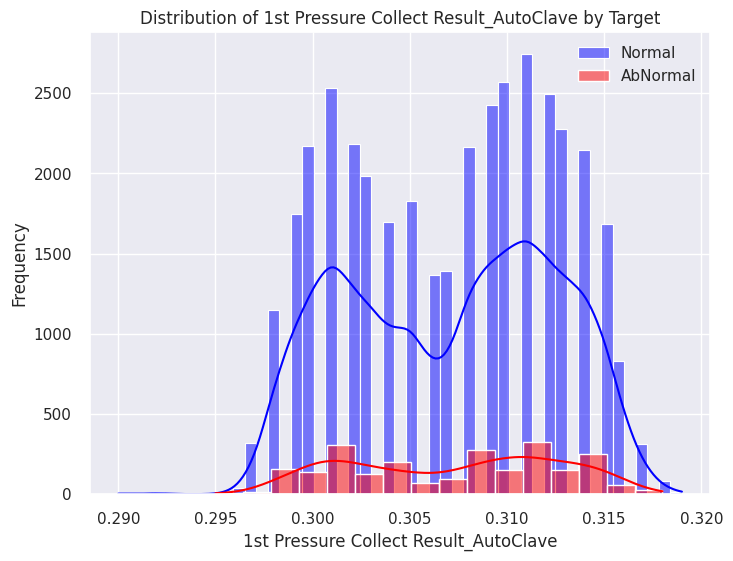

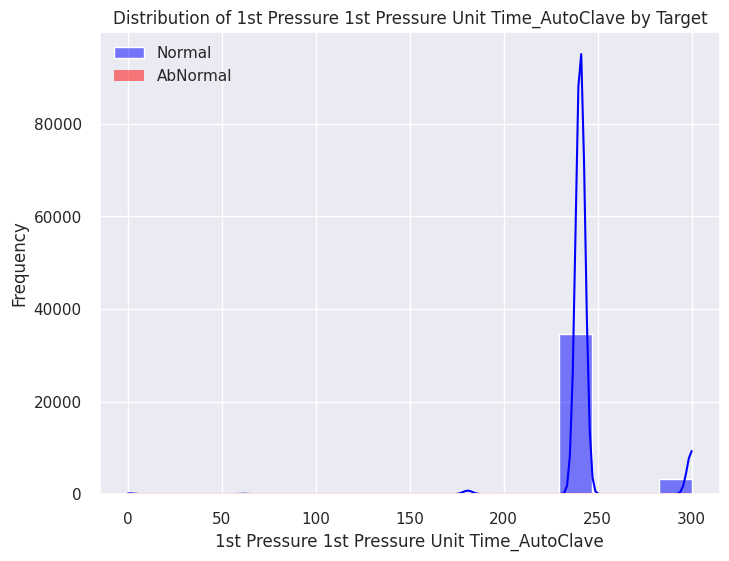

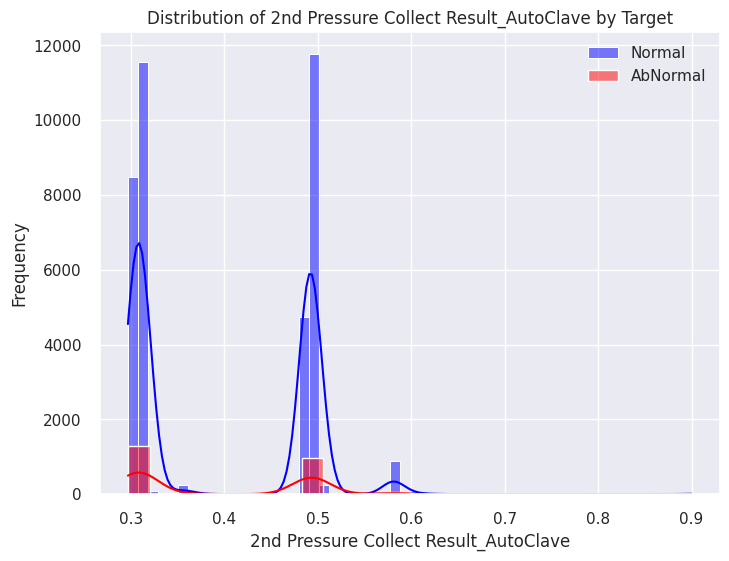

...

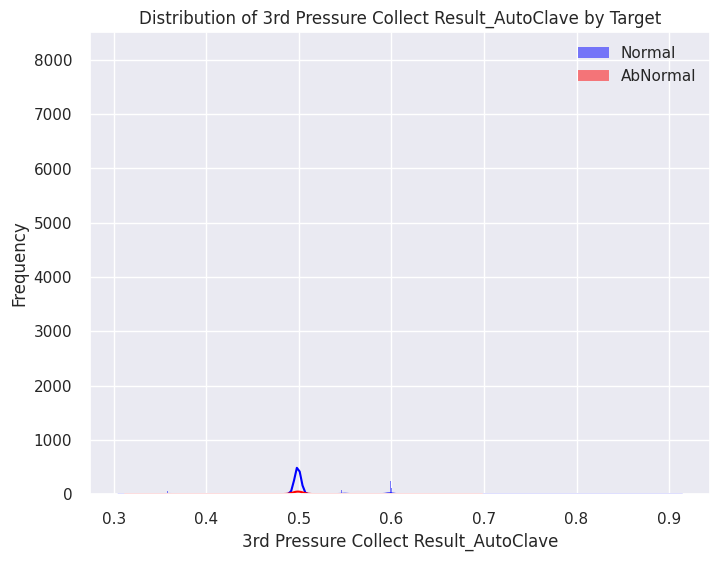

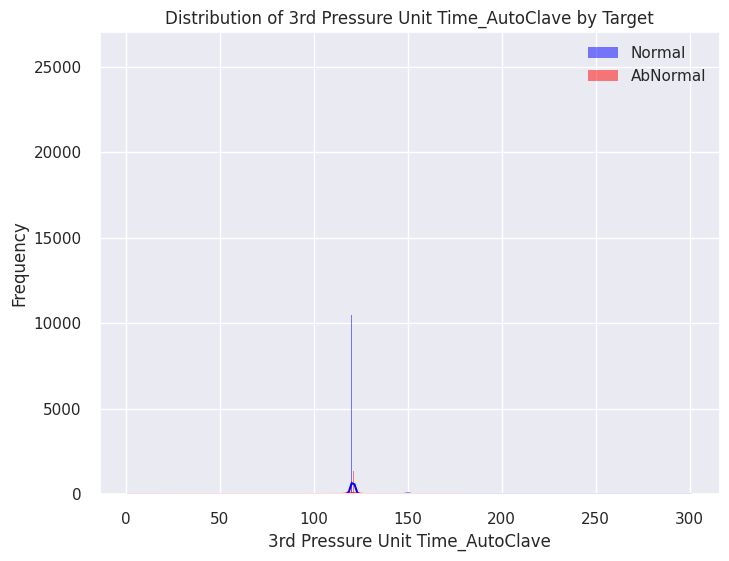

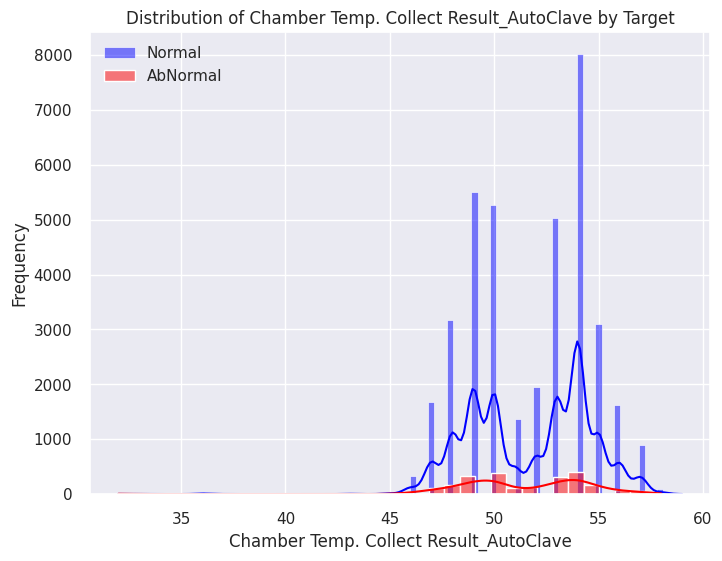

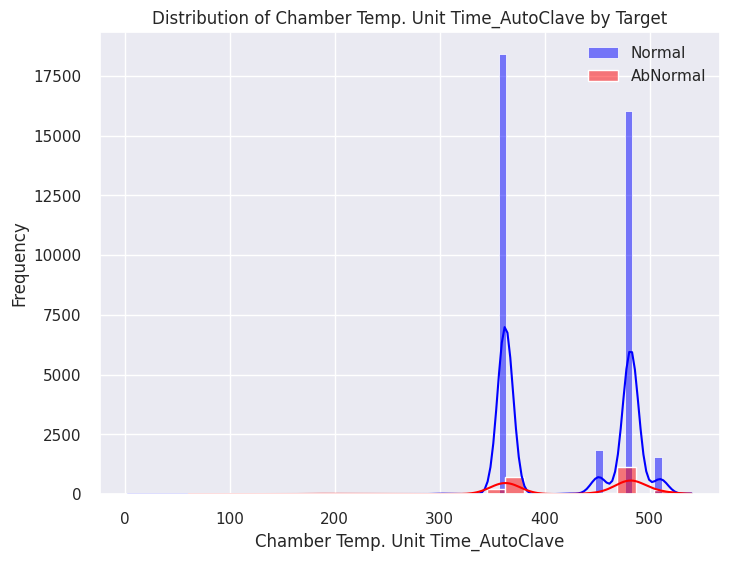

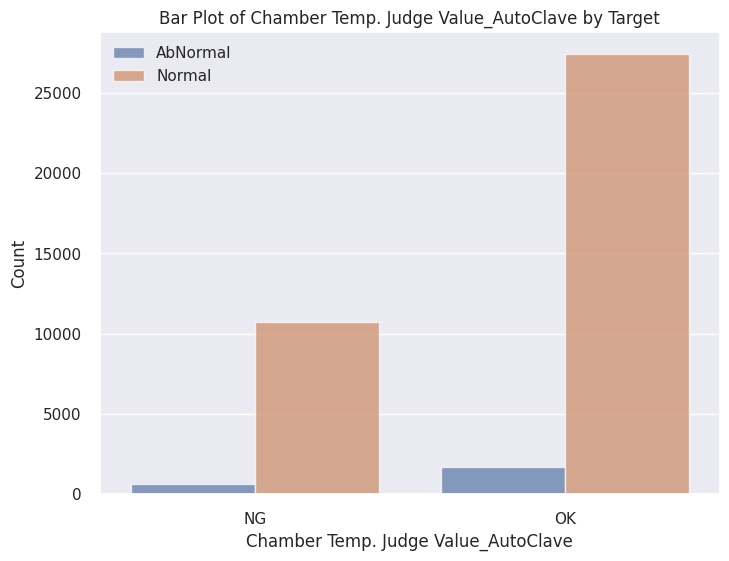

In [41]:
AC_data['target'] = train_data['target']

sns.set(font_scale=1)
target_plot(AC_data)

In [42]:
proportion_results = calculate_proportion(AC_data)

# 결과 출력
for feature, df in proportion_results.items():
    print(f"Feature: {feature}")
    print(df)
    print("\n")

Feature: Model.Suffix_AutoClave
target                  AbNormal    Normal
Model.Suffix_AutoClave                    
AJX75334501             0.816170  0.836094
AJX75334502             0.097872  0.082818
AJX75334503             0.018723  0.003093
AJX75334505             0.055319  0.065652
AJX75334506             0.003404  0.003171
AJX75334507             0.007660  0.007653
AJX75334508             0.000851  0.001520


Feature: Workorder_AutoClave
target               AbNormal    Normal
Workorder_AutoClave                    
3F1X5847-2           0.005106  0.002464
3F1X9643-1           0.002979  0.003669
3F1X9644-1           0.006809  0.003695
3F1X9648-1           0.004255  0.003931
3F1X9648-2           0.000426  0.000446
...                       ...       ...
4F1XB043-1           0.000426  0.000681
4F1XB596-1           0.001277  0.003695
4F1XB738-1           0.000000  0.000472
4F1XB758-1           0.000851  0.001966
4F1XB758-2           0.004255  0.000917

[663 rows x 2 columns]


Feat

# Fill1 데이터 확인

In [43]:
F1_data = train_data.filter(like = 'Fill1')
print(f'F1 shape : {F1_data.shape}')
F1_data.describe()

F1 shape : (40506, 33)


,DISCHARGED SPEED OF RESIN Collect Result_Fill1,DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1,DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1,DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1,Dispense Volume(Stage1) Collect Result_Fill1,Dispense Volume(Stage2) Collect Result_Fill1,Dispense Volume(Stage3) Collect Result_Fill1,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1,HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1,HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1,...,Head Clean Position Y Collect Result_Fill1,Head Clean Position Z Collect Result_Fill1,Head Purge Position X Collect Result_Fill1,Head Purge Position Y Collect Result_Fill1,Head Purge Position Z Collect Result_Fill1,Machine Tact time Collect Result_Fill1,PalletID Collect Result_Fill1,Production Qty Collect Result_Fill1,Receip No Collect Result_Fill1,WorkMode Collect Result_Fill1
count,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,...,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000
mean,10.610606,13.338538,3.885679,13.368997,12.636729,3.681266,12.665543,681.146171,336.908115,348.980914,...,93.596766,67.134829,172.108399,191.956772,76.277712,110.099269,37.596215,73.527132,108.667926,3.613736
std,0.255546,0.673930,0.699187,0.519626,0.543178,0.658339,0.361528,188.471206,149.640798,329.498146,...,36.046591,20.724334,96.648080,117.372414,37.088273,31.248510,26.606793,105.165169,130.752720,3.015700
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,156.100000,157.000000,156.100000,...,50.000000,50.000000,92.200000,50.000000,50.000000,40.300000,0.000000,0.000000,0.000000,1.000000
25%,10.600000,12.900000,3.600000,12.900000,12.250000,3.420000,12.250000,458.800000,157.000000,157.000000,...,50.000000,50.000000,92.200000,50.000000,50.000000,90.200000,7.000000,7.000000,1.000000,1.000000
50%,10.600000,13.400000,3.600000,13.500000,12.730000,3.420000,12.730000,837.700000,458.300000,157.000000,...,123.400000,50.000000,92.200000,289.000000,50.000000,128.000000,54.300000,13.000000,49.000000,1.000000
75%,10.600000,13.500000,3.900000,13.500000,12.820000,3.700000,12.820000,838.400000,458.400000,430.200000,...,123.400000,92.200000,289.000000,289.000000,85.000000,128.000000,57.500000,120.000000,196.000000,7.000000
max,10.900000,17.400000,14.800000,17.400000,14.060000,14.060000,14.060000,838.400000,838.400000,1323.200000,...,123.400000,92.200000,289.000000,289.000000,145.000000,161.400000,214.900000,487.000000,608.000000,17.000000


<Figure size 2500x2000 with 0 Axes>

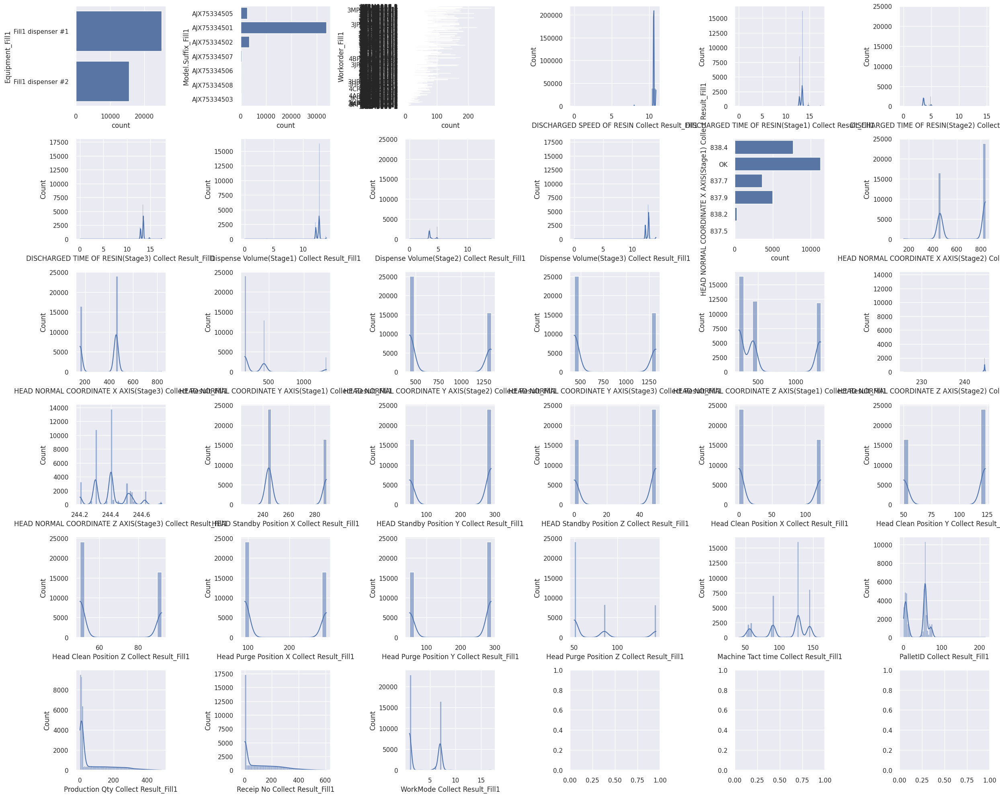

In [44]:
plot_dist(6, 6, F1_data)

Text(0.5, 1.0, 'Correlation Heatmap')

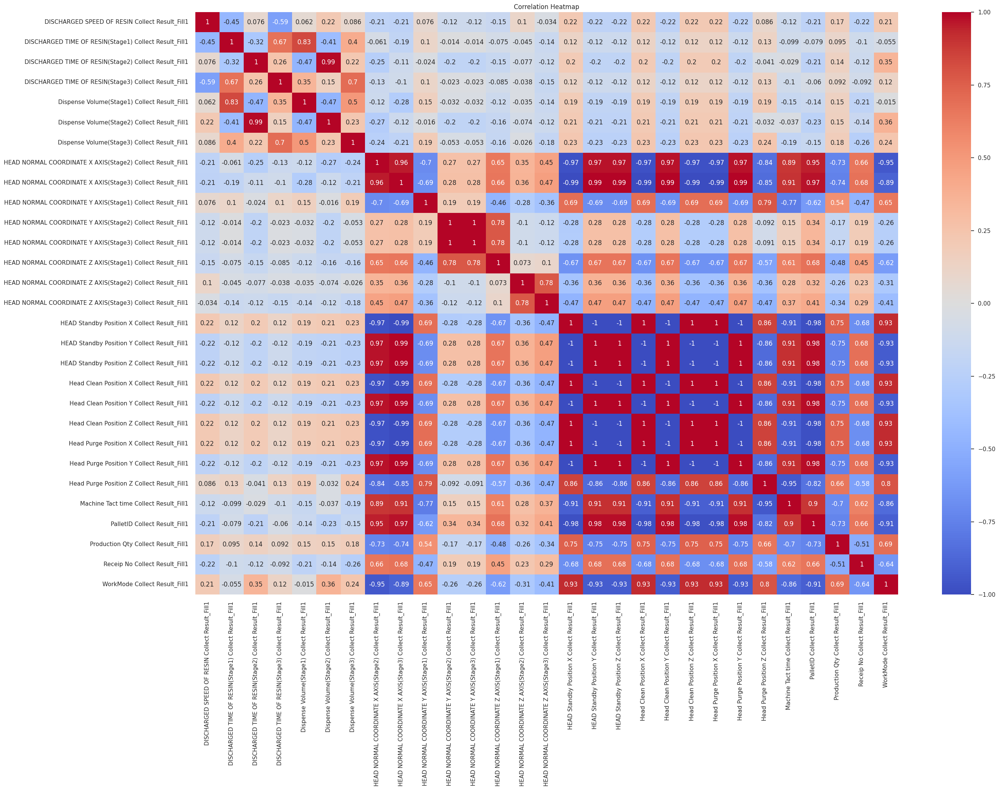

In [45]:
sns.set(font_scale=1)
plt.figure(figsize=(30, 20))

numeric_cols = F1_data.select_dtypes(include='number')

sns.heatmap(numeric_cols.corr(method='pearson'), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')

In [46]:
perfect_cor = find_pair(F1_data)

('HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1')
('HEAD Standby Position Y Collect Result_Fill1', 'HEAD Standby Position Z Collect Result_Fill1')
('HEAD Standby Position Y Collect Result_Fill1', 'Head Clean Position Y Collect Result_Fill1')
('HEAD Standby Position Y Collect Result_Fill1', 'Head Purge Position Y Collect Result_Fill1')
('HEAD Standby Position Z Collect Result_Fill1', 'Head Clean Position Y Collect Result_Fill1')
('HEAD Standby Position Z Collect Result_Fill1', 'Head Purge Position Y Collect Result_Fill1')
('Head Clean Position X Collect Result_Fill1', 'Head Clean Position Z Collect Result_Fill1')
('Head Clean Position X Collect Result_Fill1', 'Head Purge Position X Collect Result_Fill1')
('Head Clean Position Y Collect Result_Fill1', 'Head Purge Position Y Collect Result_Fill1')
('Head Clean Position Z Collect Result_Fill1', 'Head Purge Position X Collect Result_Fill1')


In [47]:
per_cor_variables = check_pair(perfect_cor, F1_data)

=============== check pair
NG OK OK OK OK OK OK OK OK OK 
 =============== Whole : 10 / num of NG : 1


In [48]:
# 완벽한 상관 1 확인.
unique_variables = set()

# 각 쌍에서 변수들을 세트에 추가
for pair in per_cor_variables:
    unique_variables.update(pair)
    unique_variables_list = list(unique_variables)
unique_variables_list

['Head Clean Position Z Collect Result_Fill1',
 'HEAD Standby Position Z Collect Result_Fill1',
 'Head Clean Position X Collect Result_Fill1',
 'Head Purge Position Y Collect Result_Fill1',
 'HEAD Standby Position Y Collect Result_Fill1',
 'Head Purge Position X Collect Result_Fill1',
 'Head Clean Position Y Collect Result_Fill1']

<Figure size 2500x2000 with 0 Axes>

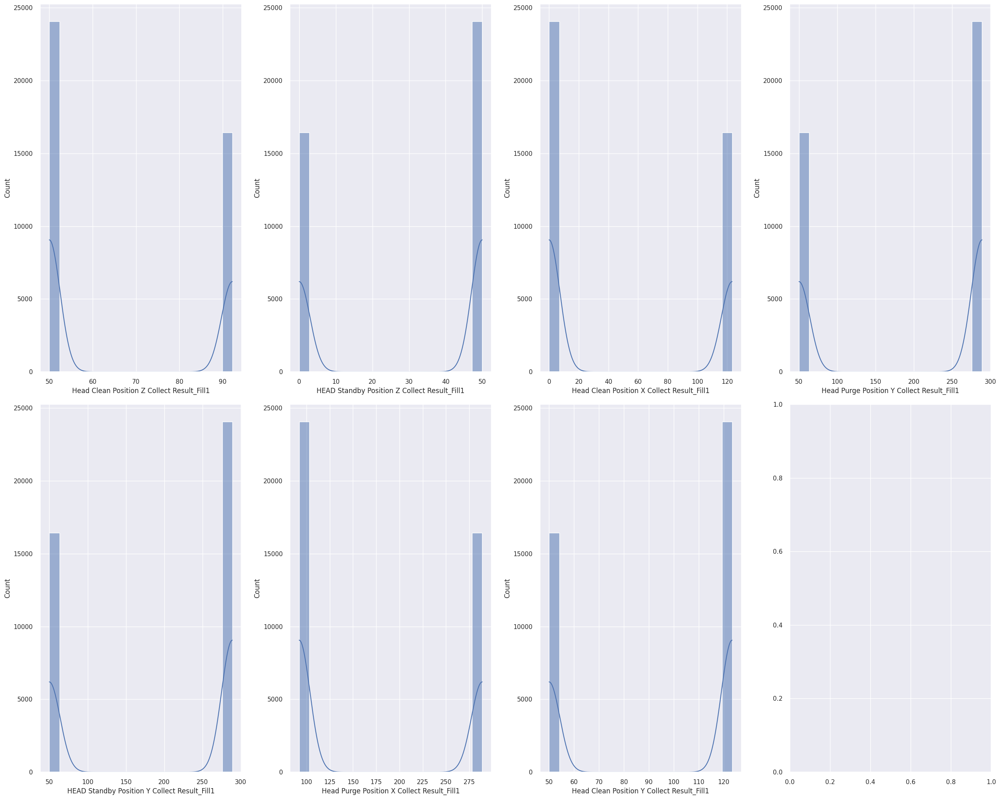

In [49]:
plot_dist(4, 2, F1_data[unique_variables_list])

In [50]:
# 파생변수 없이 제거해보기
del_col = ['HEAD Standby Position Z Collect Result_Fill1',
          'Head Clean Position Y Collect Result_Fill1',
          'Head Purge Position Y Collect Result_Fill1',
          'Head Clean Position Z Collect Result_Fill1',
          'Head Purge Position X Collect Result_Fill1']

F1_data = F1_data.drop(del_col, axis=1)

## target과 관계 확인

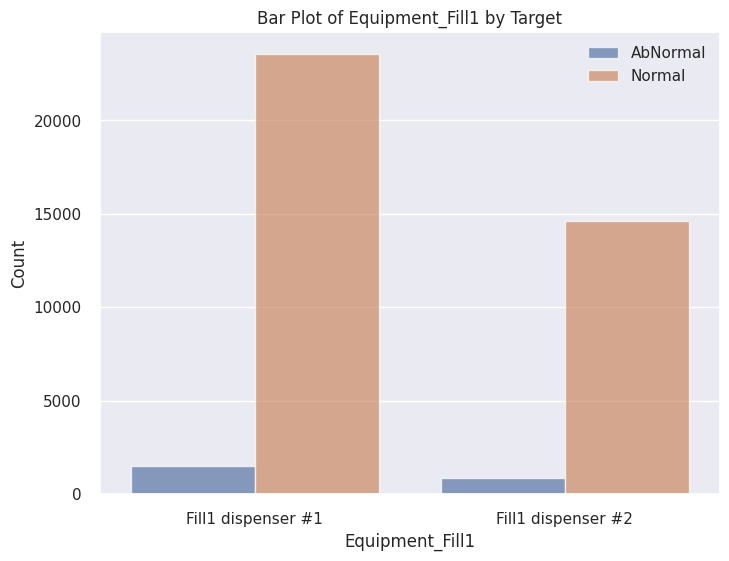

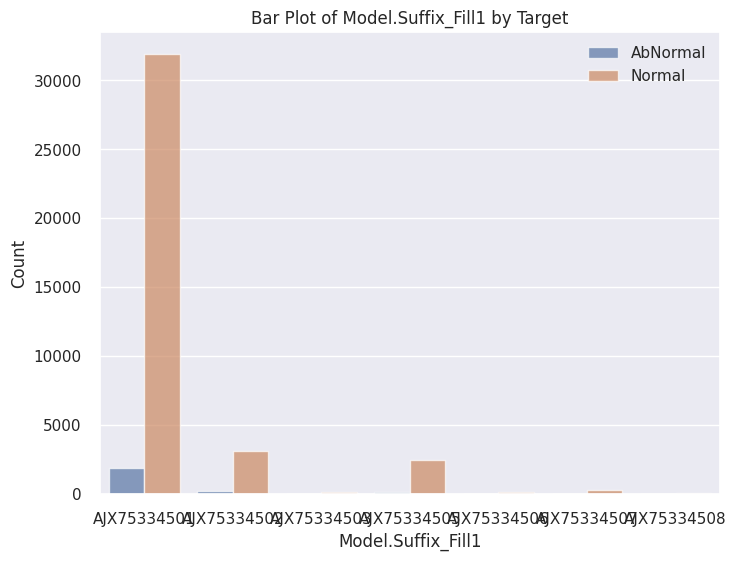

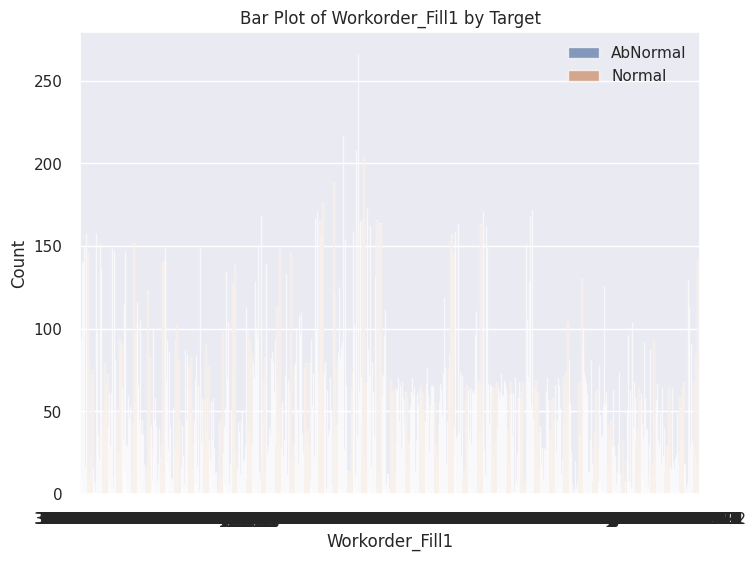

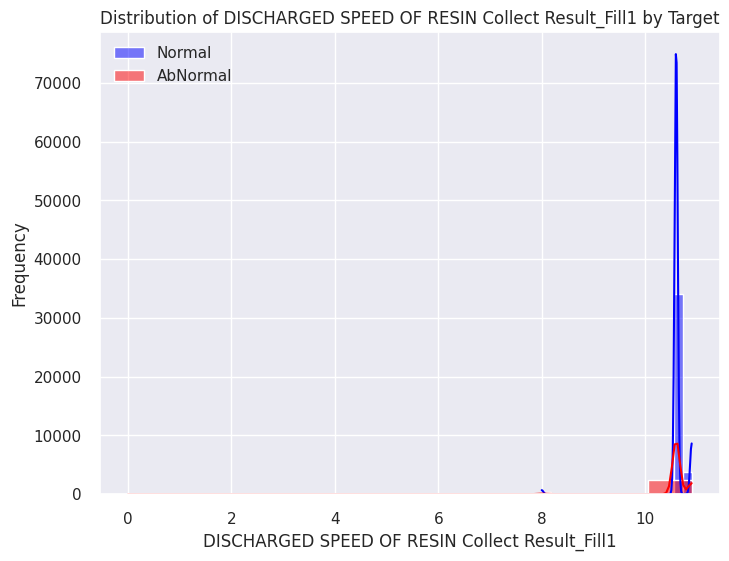

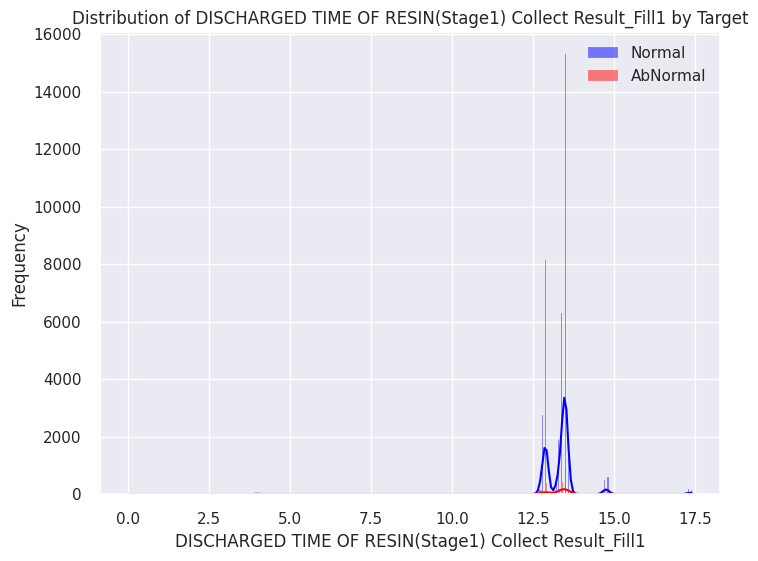

...

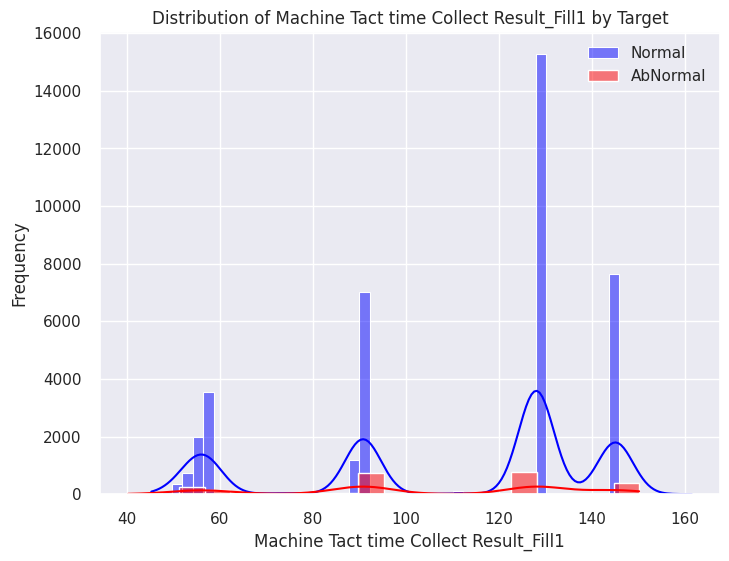

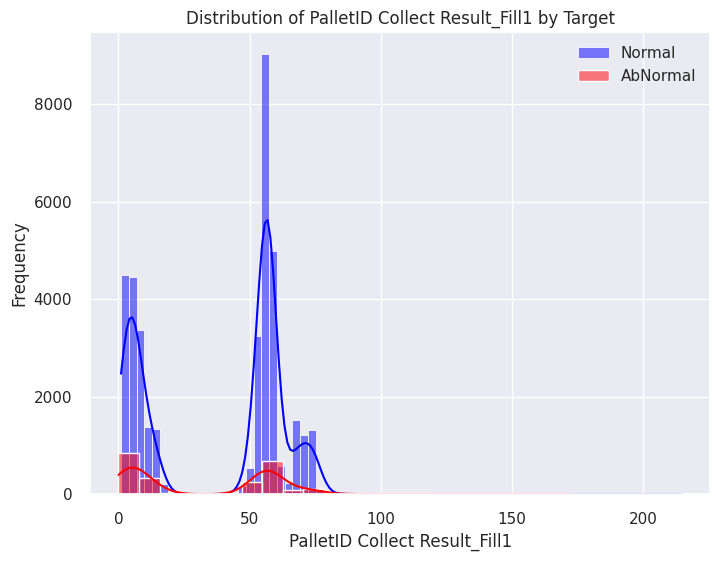

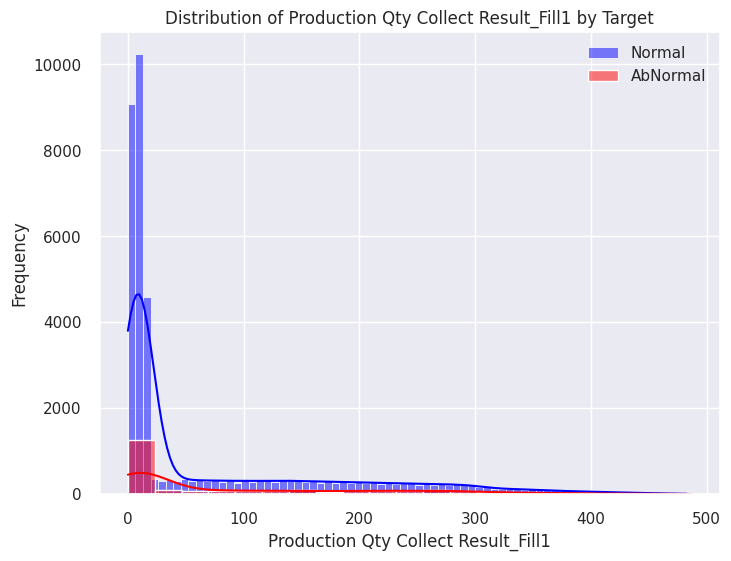

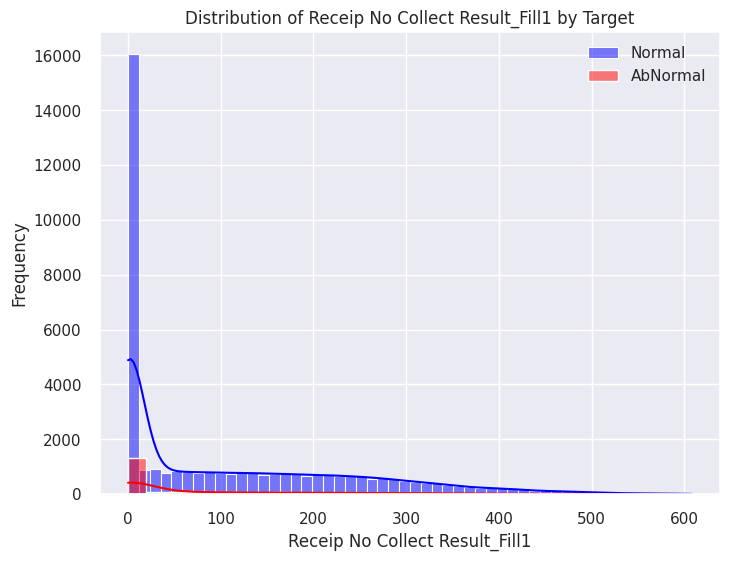

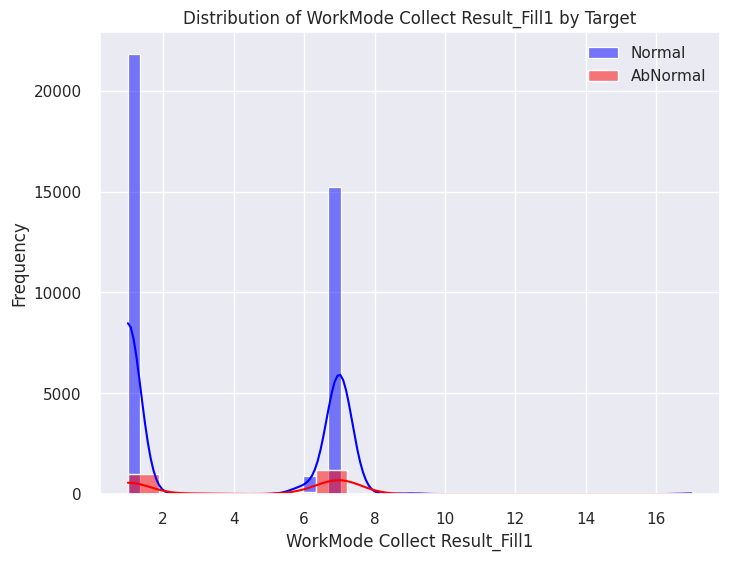

In [51]:
F1_data['target'] = train_data['target']

target_plot(F1_data)

In [52]:
proportion_results = calculate_proportion(F1_data)

# 결과 출력
for feature, df in proportion_results.items():
    print(f"Feature: {feature}")
    print(df)
    print("\n")

Feature: Equipment_Fill1
target              AbNormal    Normal
Equipment_Fill1                       
Fill1 dispenser #1  0.630638  0.617072
Fill1 dispenser #2  0.369362  0.382928


Feature: Model.Suffix_Fill1
target              AbNormal    Normal
Model.Suffix_Fill1                    
AJX75334501         0.816170  0.836094
AJX75334502         0.097872  0.082818
AJX75334503         0.018723  0.003093
AJX75334505         0.055319  0.065652
AJX75334506         0.003404  0.003171
AJX75334507         0.007660  0.007653
AJX75334508         0.000851  0.001520


Feature: Workorder_Fill1
target           AbNormal    Normal
Workorder_Fill1                    
3F1X5847-2       0.005106  0.002464
3F1X9643-1       0.002979  0.003669
3F1X9644-1       0.006809  0.003695
3F1X9648-1       0.004255  0.003931
3F1X9648-2       0.000426  0.000446
...                   ...       ...
4F1XB043-1       0.000426  0.000681
4F1XB596-1       0.001277  0.003695
4F1XB738-1       0.000000  0.000472
4F1XB758-1     

# Fill2 데이터 확인

In [53]:
F2_data = train_data.filter(like = 'Fill2')
print(f'F2 shape : {F2_data.shape}')
F2_data.describe()

F2 shape : (40506, 32)


,CURE END POSITION X Collect Result_Fill2,CURE END POSITION Z Collect Result_Fill2,CURE SPEED Collect Result_Fill2,CURE STANDBY POSITION Z Collect Result_Fill2,CURE START POSITION X Collect Result_Fill2,CURE START POSITION Z Collect Result_Fill2,HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill2,HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill2,HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill2,HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2,...,Head Clean Position Y Collect Result_Fill2,Head Clean Position Z Collect Result_Fill2,Head Purge Position X Collect Result_Fill2,Head Purge Position Y Collect Result_Fill2,Head Purge Position Z Collect Result_Fill2,Machine Tact time Collect Result_Fill2,PalletID Collect Result_Fill2,Production Qty Collect Result_Fill2,Receip No Collect Result_Fill2,WorkMode Collect Result_Fill2
count,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,...,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000,40506.000000
mean,242.541846,32.793784,49.623587,32.701229,1017.458154,32.701229,530.044018,395.193744,503.670632,770.465047,...,90.983336,66.972414,164.156081,180.671505,64.211351,62.048909,14.385928,73.539648,108.691453,0.771392
std,44.454779,0.651463,1.358472,1.391567,44.454779,1.391567,211.229599,174.540641,328.974274,435.508924,...,33.885760,20.527895,87.513657,108.041552,17.188429,36.466634,7.261448,105.176311,130.758018,1.289203
min,240.000000,22.000000,40.000000,22.000000,240.000000,22.000000,304.800000,156.000000,156.000000,427.900000,...,50.000000,50.000000,91.800000,50.000000,50.000000,17.600000,1.000000,0.000000,0.000000,0.000000
25%,240.000000,33.000000,50.000000,33.000000,1020.000000,33.000000,305.000000,156.000000,156.000000,427.900000,...,50.000000,50.000000,91.800000,50.000000,50.000000,19.600000,7.000000,7.000000,1.000000,0.000000
50%,240.000000,33.000000,50.000000,33.000000,1020.000000,33.000000,458.000000,458.000000,428.000000,428.000000,...,119.000000,50.000000,91.800000,270.000000,50.000000,85.000000,19.500000,13.000000,49.000000,1.000000
75%,240.000000,33.000000,50.000000,33.000000,1020.000000,33.000000,835.500000,499.800000,694.000000,1324.200000,...,119.000000,91.800000,270.000000,270.000000,85.000000,85.000000,19.900000,120.000000,196.000000,1.000000
max,1020.000000,33.000000,75.000000,33.000000,1020.000000,33.000000,835.500000,694.000000,1324.200000,1324.200000,...,119.000000,91.800000,270.000000,270.000000,85.000000,284.100000,52.900000,487.000000,608.000000,17.000000


<Figure size 2500x2000 with 0 Axes>

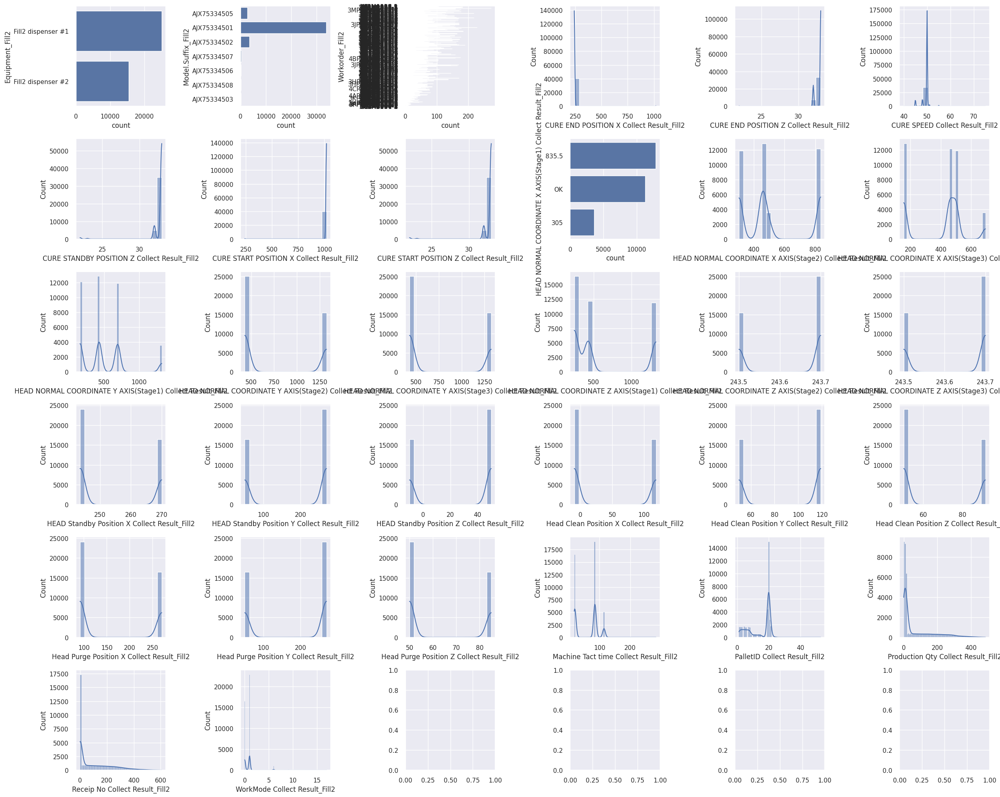

In [54]:
plot_dist(6, 6, F2_data)

Text(0.5, 1.0, 'Correlation Heatmap')

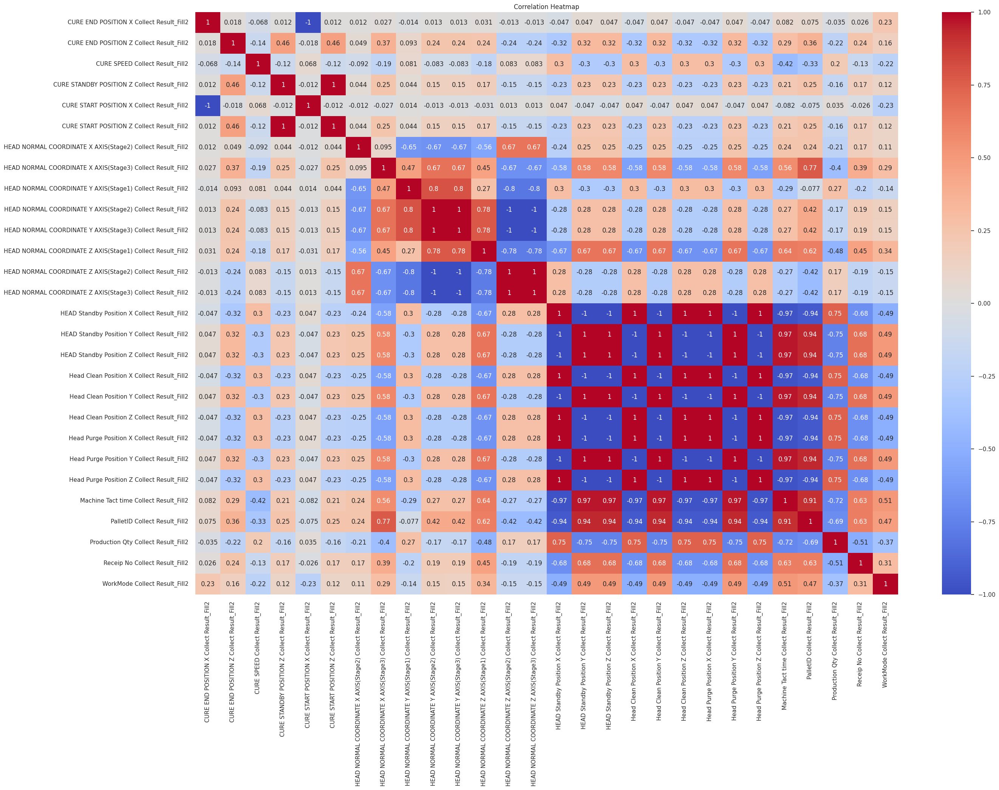

In [55]:
sns.set(font_scale=1)
plt.figure(figsize=(30, 20))

numeric_cols = F2_data.select_dtypes(include='number')

sns.heatmap(numeric_cols.corr(method='pearson'), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')

In [56]:
perfect_cor = find_pair(F2_data)

('CURE STANDBY POSITION Z Collect Result_Fill2', 'CURE START POSITION Z Collect Result_Fill2')
('HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2')
('HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill2', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2')
('HEAD Standby Position Y Collect Result_Fill2', 'HEAD Standby Position Z Collect Result_Fill2')
('HEAD Standby Position Y Collect Result_Fill2', 'Head Clean Position Y Collect Result_Fill2')
('HEAD Standby Position Y Collect Result_Fill2', 'Head Purge Position Y Collect Result_Fill2')
('HEAD Standby Position Z Collect Result_Fill2', 'Head Clean Position Y Collect Result_Fill2')
('HEAD Standby Position Z Collect Result_Fill2', 'Head Purge Position Y Collect Result_Fill2')
('Head Clean Position X Collect Result_Fill2', 'Head Clean Position Z Collect Result_Fill2')
('Head Clean Position X Collect Result_Fill2', 'Head Purge Position X Collect Result_

In [57]:
per_cor_variables = check_pair(perfect_cor, F2_data)

=============== check pair
NG OK OK OK OK OK OK OK OK OK OK OK OK OK OK 
 =============== Whole : 15 / num of NG : 1


In [58]:
# 완벽한 상관 1 확인.
unique_variables = set()

# 각 쌍에서 변수들을 세트에 추가
for pair in per_cor_variables:
    unique_variables.update(pair)
    unique_variables_list = list(unique_variables)
unique_variables_list

['Head Clean Position X Collect Result_Fill2',
 'Head Purge Position X Collect Result_Fill2',
 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill2',
 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2',
 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2',
 'HEAD Standby Position Z Collect Result_Fill2',
 'Head Purge Position Y Collect Result_Fill2',
 'Head Clean Position Y Collect Result_Fill2',
 'HEAD Standby Position Y Collect Result_Fill2',
 'Head Clean Position Z Collect Result_Fill2',
 'Head Purge Position Z Collect Result_Fill2',
 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2']

<Figure size 2500x2000 with 0 Axes>

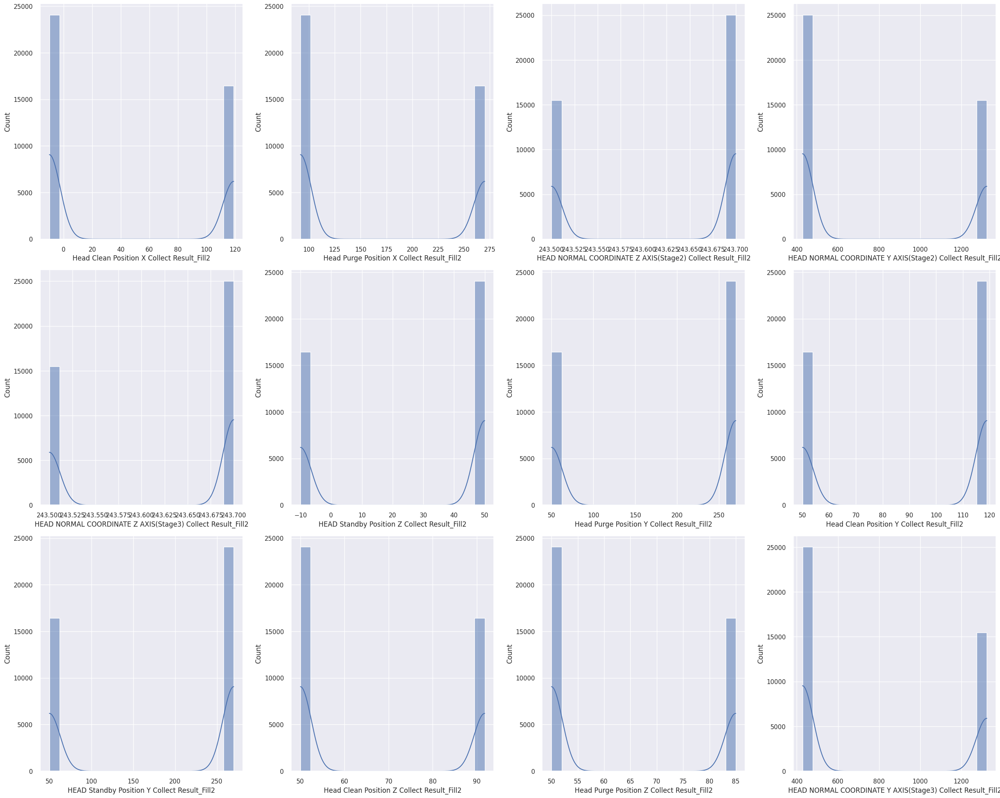

In [59]:
plot_dist(4, 3, F2_data[unique_variables_list])

In [60]:
per_cor_variables

[('HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill2',
  'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2'),
 ('HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill2',
  'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2'),
 ('HEAD Standby Position Y Collect Result_Fill2',
  'HEAD Standby Position Z Collect Result_Fill2'),
 ('HEAD Standby Position Y Collect Result_Fill2',
  'Head Clean Position Y Collect Result_Fill2'),
 ('HEAD Standby Position Y Collect Result_Fill2',
  'Head Purge Position Y Collect Result_Fill2'),
 ('HEAD Standby Position Z Collect Result_Fill2',
  'Head Clean Position Y Collect Result_Fill2'),
 ('HEAD Standby Position Z Collect Result_Fill2',
  'Head Purge Position Y Collect Result_Fill2'),
 ('Head Clean Position X Collect Result_Fill2',
  'Head Clean Position Z Collect Result_Fill2'),
 ('Head Clean Position X Collect Result_Fill2',
  'Head Purge Position X Collect Result_Fill2'),
 ('Head Clean Position X Collect Result_Fill2',
  '

In [61]:
# 파생변수 없이 제거해보기
del_col = ['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill2',
          'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill2',
          'HEAD Standby Position Z Collect Result_Fill2',
          'Head Clean Position Y Collect Result_Fill2',
          'Head Purge Position Y Collect Result_Fill2',
          'Head Clean Position Z Collect Result_Fill2',
          'Head Purge Position X Collect Result_Fill2',
          'Head Purge Position Z Collect Result_Fill2']

F2_data = F2_data.drop(del_col, axis=1)

## target과 관계 확인

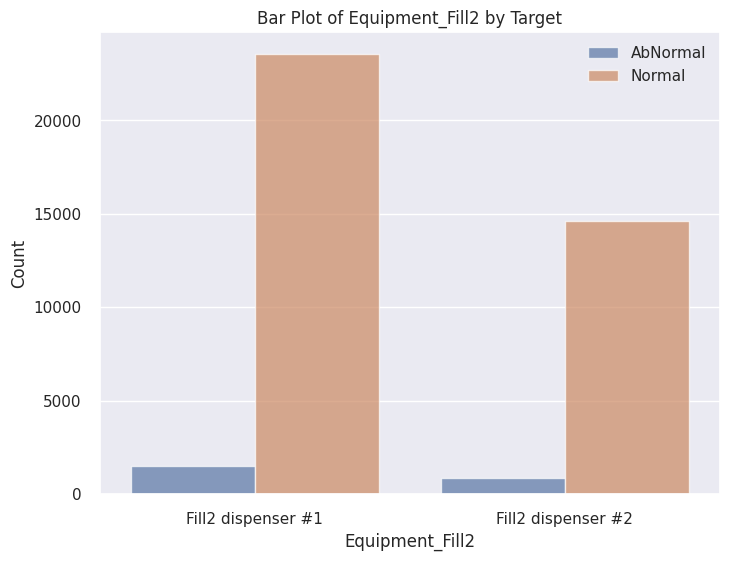

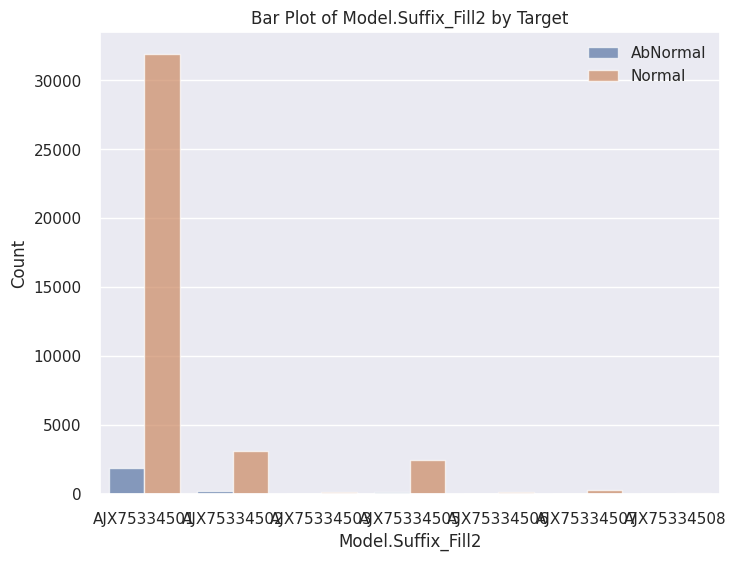

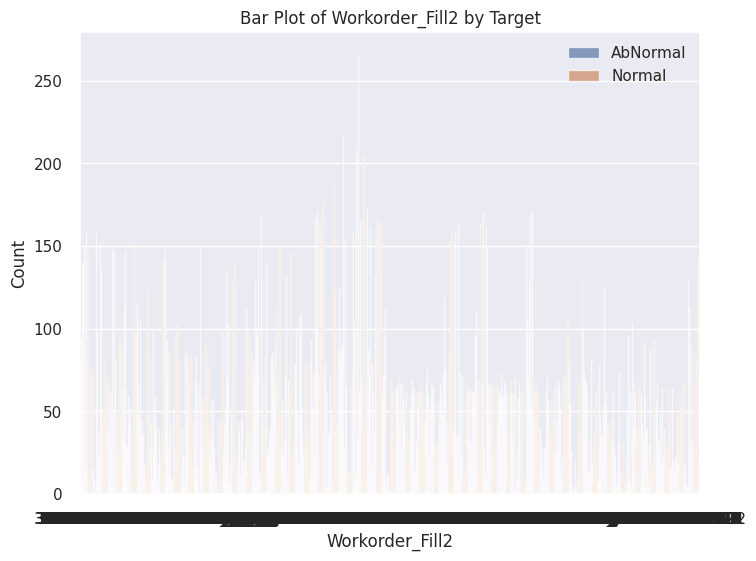

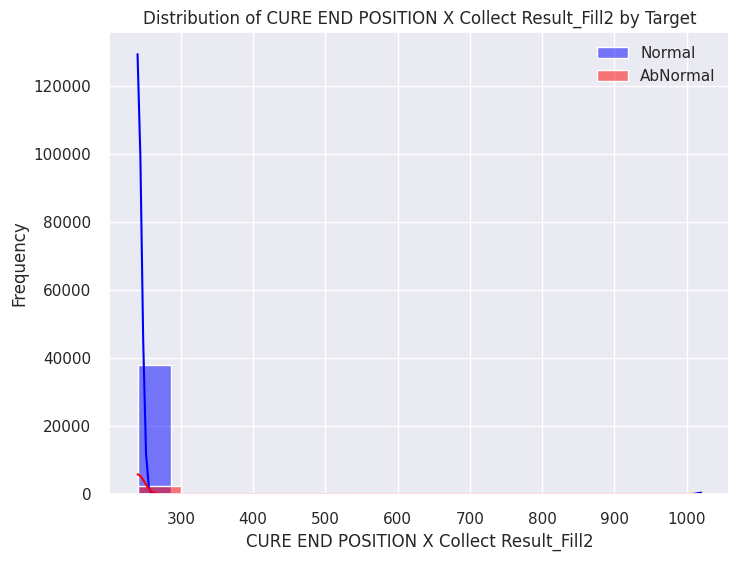

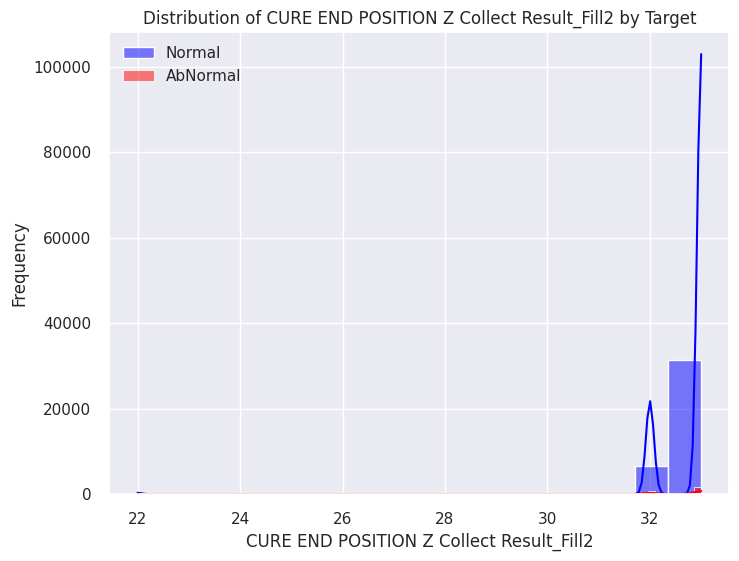

...

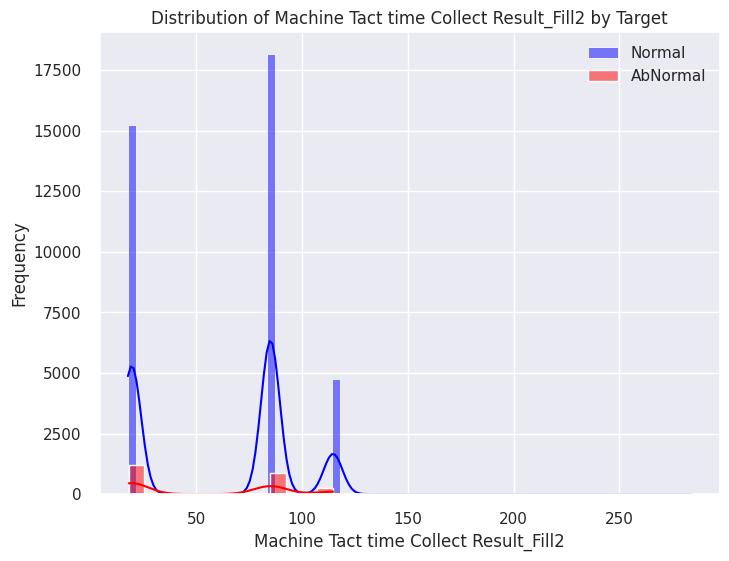

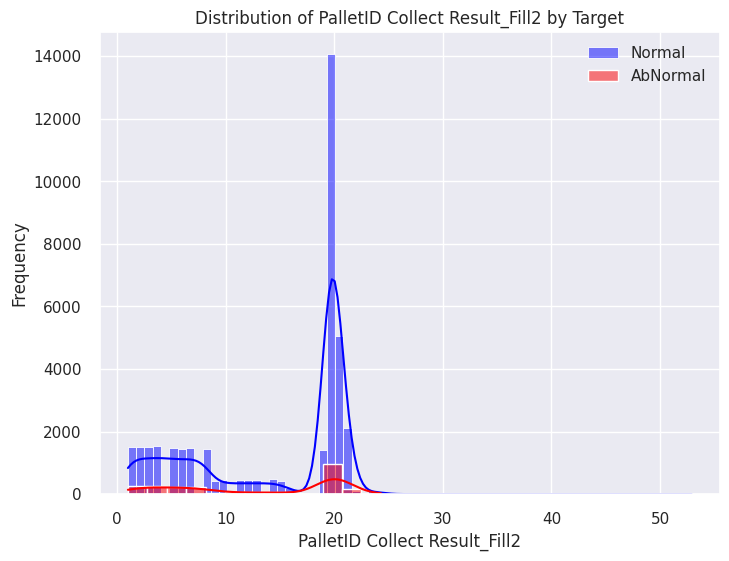

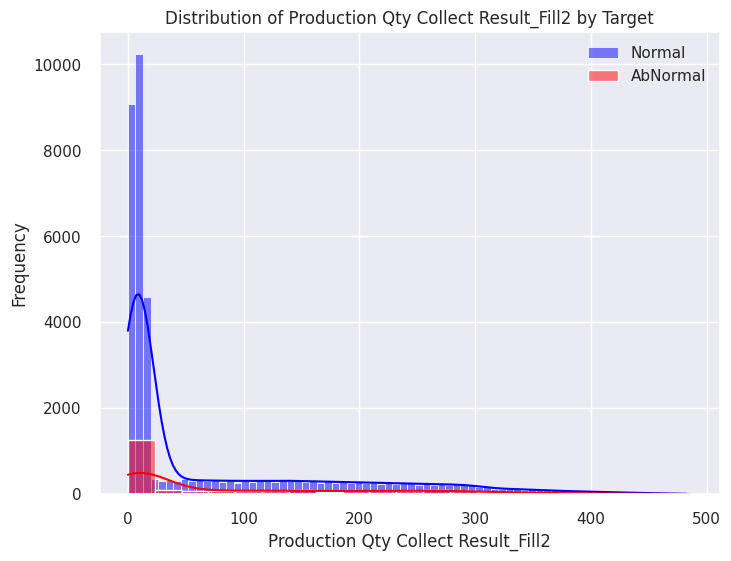

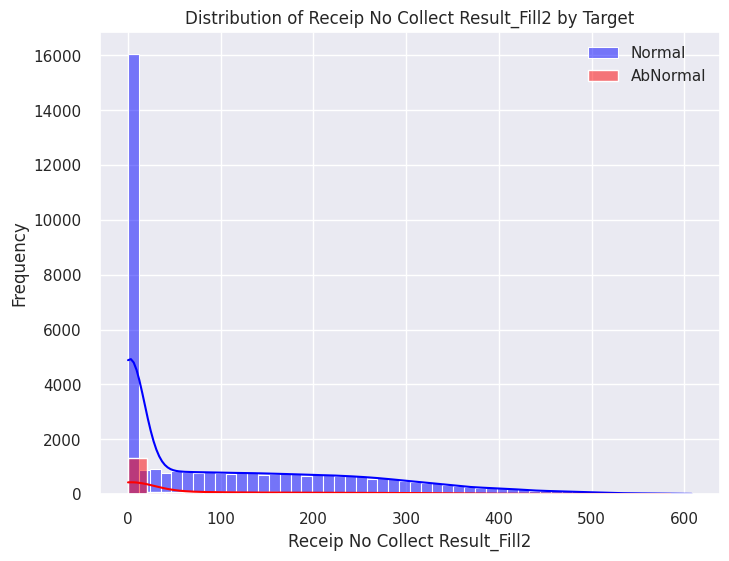

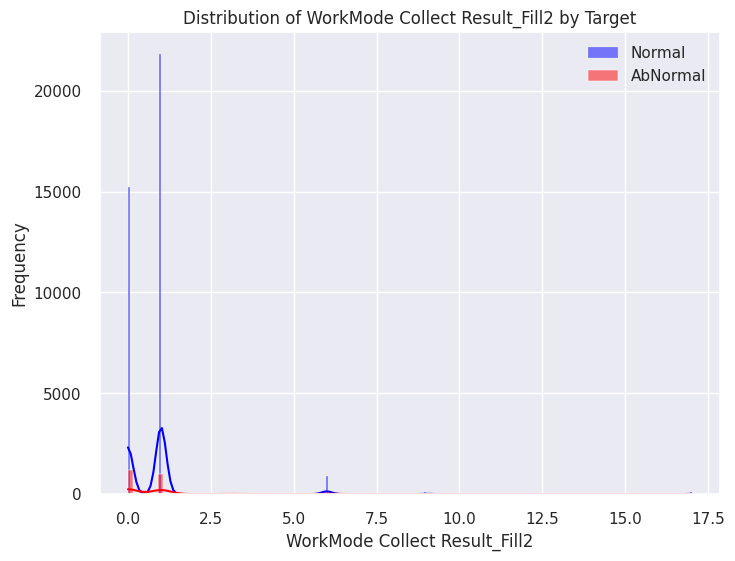

In [62]:
F2_data['target'] = train_data['target']

target_plot(F2_data)

In [63]:
proportion_results = calculate_proportion(F2_data)

# 결과 출력
for feature, df in proportion_results.items():
    print(f"Feature: {feature}")
    print(df)
    print("\n")

Feature: Equipment_Fill2
target              AbNormal    Normal
Equipment_Fill2                       
Fill2 dispenser #1  0.630213  0.617072
Fill2 dispenser #2  0.369787  0.382928


Feature: Model.Suffix_Fill2
target              AbNormal    Normal
Model.Suffix_Fill2                    
AJX75334501         0.816170  0.836094
AJX75334502         0.097872  0.082818
AJX75334503         0.018723  0.003093
AJX75334505         0.055319  0.065652
AJX75334506         0.003404  0.003171
AJX75334507         0.007660  0.007653
AJX75334508         0.000851  0.001520


Feature: Workorder_Fill2
target           AbNormal    Normal
Workorder_Fill2                    
3F1X5847-2       0.005106  0.002464
3F1X9643-1       0.002979  0.003669
3F1X9644-1       0.006809  0.003695
3F1X9648-1       0.004255  0.003931
3F1X9648-2       0.000426  0.000446
...                   ...       ...
4F1XB043-1       0.000426  0.000681
4F1XB596-1       0.001277  0.003695
4F1XB738-1       0.000000  0.000472
4F1XB758-1     